In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Problem Statement

Task 1: To prepare a complete data analysis report on the given data.


Task 2: a) To create a robust machine learning algorithm to accurately predict the price of the house given the various factors across the market.      


  b) To determine the relationship between the house features and how the price varies based on this.


Task 3: To come up with suggestions for the customer to buy the house according to the area, price and other requirements.


## Importing libraries


In [6]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

print(tf.__version__)

2.15.0


## Load data

In [7]:
data=pd.read_csv('/content/HousePricePred.csv')

### ## Domain Analysis

This  dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.



### 79 explanatory variables and description



MSSubClass: Represents the type of dwelling involved in the sale, such as 1-STORY 1946 & NEWER ALL STYLES, capturing the style and age of the property.

MSZoning: Identifies the general zoning classification of the sale, offering insights into the permissible land use, such as residential low density or medium density.

LotFrontage: Indicates the linear feet of street connected to the property, giving a measure of the property's frontage and its potential impact on accessibility and aesthetics.

LotArea: Reflects the lot size in square feet, a crucial factor influencing the overall property value.

Street: Specifies the type of road access to the property, distinguishing between paved and gravel roads, affecting convenience and property value.

Alley: Describes the type of alley access to the property, providing information on additional access points.

LotShape: Defines the general shape of the property's lot, influencing property aesthetics and potentially affecting land utility.

LandContour: Indicates the flatness of the property, impacting construction feasibility and landscaping possibilities.

Utilities: Specifies the type of utilities available, such as all public utilities or electricity only, affecting convenience and livability.

LotConfig: Describes the lot configuration, providing insights into how the property is situated within its surroundings.

LandSlope: Identifies the slope of the property, which can influence drainage, landscaping, and construction considerations.

Neighborhood: Represents physical locations within Ames city limits, capturing the neighborhood's influence on property values and desirability.

Condition1 and Condition2: Indicate the proximity to various conditions (e.g., railroad, park), offering insights into potential nuisances or amenities.

BldgType: Specifies the type of dwelling, distinguishing between single-family, townhouse inside unit, etc.

HouseStyle: Represents the style of dwelling, such as 1-story or 2-story, contributing to the property's architectural characteristics.

OverallQual and OverallCond: Convey the overall material and finish quality, as well as the overall condition, influencing the property's
appeal and value.

YearBuilt and YearRemodAdd: Provide the year the house was built and remodeled, helping assess the property's age and recent upgrades.

RoofStyle and RoofMatl: Describe the roof type and material, contributing to the property's aesthetics and durability.

Exterior1st and Exterior2nd: Indicate the exterior covering on the house, influencing curb appeal and maintenance requirements.

MasVnrType and MasVnrArea: Specify the masonry veneer type and area, adding to the property's visual appeal.

ExterQual and ExterCond: Capture the exterior material quality and condition, influencing the property's durability and maintenance needs.

Foundation: Represents the type of foundation, essential for assessing the property's structural integrity.

BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinSF1, BsmtFinType2, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF: Provide insights into basement quality, condition, exposure, and size, crucial for assessing additional living space.

Heating, HeatingQC: Indicate the type of heating and heating quality, impacting comfort and energy efficiency.

CentralAir: Specifies whether the property has central air conditioning, contributing to comfort and property value.

Electrical: Represents the electrical system, a critical component for safety and functionality.

1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea: Provide square footage details for various living areas, influencing the property's size and layout.

BsmtFullBath, BsmtHalfBath, FullBath, HalfBath: Describe bathroom features, contributing to the property's functionality.

BedroomAbvGr, KitchenAbvGr, KitchenQual: Specify the number of bedrooms and kitchens, along with kitchen quality, influencing livability and property value.

TotRmsAbvGrd: Indicates the total rooms above ground, offering insights into the property's spatial layout.

Functional: Represents the home's functionality rating, crucial for assessing usability and appeal.

Fireplaces, FireplaceQu: Convey the number of fireplaces and fireplace quality, contributing to ambiance and property value.

GarageType, GarageYrBlt, GarageFinish, GarageCars, GarageArea, GarageQual, GarageCond: Provide details on the garage, including type, year built, and size, influencing property utility and value.

PavedDrive: Specifies whether the property has a paved driveway, impacting convenience and aesthetics.

WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch:
Capture porch and deck features, enhancing outdoor living and visual appeal.

PoolArea, PoolQC: Indicate pool area and quality, contributing to luxury and property value.

Fence: Describes fence quality, offering privacy and influencing property aesthetics.

MiscFeature, MiscVal: Specify miscellaneous features and their values, potentially adding unique elements to the property.

MoSold, YrSold: Represent the month and year of sale, capturing the temporal aspect of property transactions.

SaleType, SaleCondition: Describe the type and condition of the sale, providing insights into the transaction dynamics.

SalePrice: The target variable, representing the sale price of the house.


# Basic checks

In [8]:
## Call the dataframe and do basic checks
pd.set_option('display.max_columns', None)

data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [9]:
data.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [10]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [11]:
## Sum of features
pd.set_option('display.max_rows',None)
data.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [12]:
data.duplicated().sum()

0

In [13]:
# here in target we have no null value
data.SalePrice.isnull().sum()

0

In [14]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


## Insights from numerical data statistical measures

The dataset contains information on housing with 1460 entries. The target variable is SalePrice.

2)->Summary Statistics:

SalePrice has a mean of approximately  180,921𝑎𝑛𝑑𝑎𝑚𝑒𝑑𝑖𝑎𝑛(50𝑡ℎ𝑝𝑒𝑟𝑐𝑒𝑛𝑡𝑖𝑙𝑒)𝑜𝑓
 163,000. The prices vary widely, ranging from  34,900𝑡𝑜
 755,000.

3)->Year Information:

The houses in the dataset were generally built between 1872 and 2010, with an average year of construction around 1971. The average year of remodeling is approximately 1984, with a range from 1950 to 2010.

4)->Lot Characteristics:

LotFrontage has missing values (1201 non-null), and the mean lot frontage is approximately 70. LotArea varies widely, with an average lot area of approximately 10,516 square feet.

5)->Quality and Condition:

OverallQual and OverallCond represent the overall material and finish quality and overall condition of the house, respectively. OverallQual has a mean of approximately 6, indicating an above-average quality on average.

6)->Living Area:

The average above-ground living area (GrLivArea) is approximately 1,515 square feet. There is variation in low-quality finished square feet (LowQualFinSF), with an average of 5.84.

7)->Basement Information:

TotalBsmtSF represents the total square feet of the basement area, with an average of approximately 1,057 square feet. BsmtFullBath and BsmtHalfBath indicate the number of basement full bathrooms and half bathrooms, respectively.

8)->Garage Information:

GarageYrBlt has missing values (1379 non-null) and represents the year the garage was built. GarageCars and GarageArea represent the capacity and size of the garage, respectively.

9)->Outdoor Features:

WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, and ScreenPorch represent different types of porches and decks. There is variability in the presence of pools (PoolArea) and miscellaneous features (MiscVal).

10)Time Information:

Houses were sold between 2006 and 2010, with an average sale year of approximately 2008. MoSold represents the month of sale.

In [15]:
data.describe(include = 'O')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


## Categorical data insights

A) Cardinality:

    1) The MSZoning feature has 5 unique values, with "RL" being the most frequent (1151 occurrences).

    2) Street is binary with "Pave" occurring 1454 times.

    3) Alley has two values ("Grvl" and "Pave"), with "Grvl" appearing 50 times.



B) Lot Characteristics:

    1) LotShape has 4 unique values, with "Reg" being the most frequent (925 occurrences).

    2) LandContour has 4 unique values, with "Lvl" being the most frequent (1311 occurrences).

    3) Utilities is mostly constant, with "AllPub" occurring 1459 times.


c) Location and Configuration:

    1) LotConfig has 5 unique values, with "Inside" being the most frequent (1052 occurrences).

    2) LandSlope is mostly gentle ("Gtl") and appears 1382 times.


D) Neighborhood and Conditions:

    1) Neighborhood has 25 unique values, with "NAmes" being the most frequent (225 occurrences).

    2) Condition1 and Condition2 represent proximity to various conditions; most occurrences are "Norm" in both cases.


E) Building Characteristics:

    1) BldgType mostly consists of single-family homes ("1Fam" - 1220 occurrences).

    2) HouseStyle is predominantly one-story houses ("1Story" - 726 occurrences).

    3) RoofStyle is mostly "Gable" (1141 occurrences), and RoofMatl is primarily "CompShg" (1434 occurrences).


F) Exterior and Masonry Veneer:

    1) Exterior1st and Exterior2nd represent the exterior covering of the house; "VinylSd" is the most common for both.

    2) MasVnrType has 5 unique values, with "None" being the most frequent (864 occurrences).


G) Basement Characteristics:

    1) BsmtQual and BsmtCond represent the overall condition of the basement; both are mostly "TA" (Tabulated Area).

    2) BsmtExposure is mostly "No," indicating no exposure to a basement wall.


H) Heating and Air Conditioning:

    1) Heating is mostly "GasA," and HeatingQC is predominantly "Ex" (Excellent).

    2) CentralAir is mostly "Y," indicating central air conditioning.


I) Electrical and Kitchen Quality:

    1) Electrical mostly consists of "SBrkr."

    2) KitchenQual is predominantly "TA" (Tabulated Area).


J) Fireplaces and Garage:

    1) Functional is mostly "Typ" (Typical Functionality).

    2) FireplaceQu represents the quality of fireplaces; "Gd" (Good) is most common.


K) Garage Characteristics:

    1) GarageType mostly consists of attached garages ("Attchd" - 1365 occurrences).

    2) GarageFinish is mostly "Unf" (Unfinished).


L) Paved Driveway and Pool:

    1) PavedDrive is mostly "Y," indicating a paved driveway.

    2) PoolQC has only 3 non-null values and mostly "Gd" (Good).


M) Fence and Miscellaneous Features:

    1) Fence has 157 occurrences of "MnPrv" (Minimum Privacy).

    2) MiscFeature has 49 occurrences of "Shed."


N)->Sale Type and Condition:

    1) SaleType mostly consists of "WD" (Warranty Deed - Conventional).

    2) SaleCondition is mostly "Normal.

Addressing the complexities of a high-dimensional regression problem with 79 variables necessitates a strategic data preprocessing approach to optimize model performance. Initial data inspection is crucial to categorize the variables into distinct types (categorical, continuous/discrete numerical, and datetime series).

This comprehensive plan ensures tailored handling of each type, including encoding techniques, differentiation between continuous and discrete numerical variables, and missing data imputation. Such a systematic approach streamlines the complexities inherent in such large datasets, leading to a more robust regression analysis.

Ultimately, the goal is to establish a well-structured foundation for the regression model. It should also maximize its predictive capabilities within the context of the 79 variables under consideration.

### Fetching numerical features from dataset

In [16]:
# Fetching only categorical columns from the data

categorical_cols = data.select_dtypes('object').columns
print(categorical_cols)

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')


In [17]:
##creating a sub_data for categorcal variables and sales price

data_categorical = pd.concat([data[categorical_cols],data['SalePrice']], axis=1)

In [18]:
# prompt: fetch only numerical continuous columns from data, exclude datetime column

numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
numerical_cols

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [20]:
data_numerical = data[numerical_cols]
print(len(numerical_cols))

38


In [21]:
# prompt: fetch only numerical continuous columns from data, exclude datetime column

numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
numerical_cols

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [22]:
data_numerical = data[numerical_cols]
print(len(numerical_cols))

38


In [23]:
datetime_cols = [col for col in data if 'Yr'in  col or 'Year'in  col ]
datetime_cols

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [24]:
data_datetime = pd.concat([data[datetime_cols],data['SalePrice']], axis=1)
data_datetime

,YearBuilt,YearRemodAdd,GarageYrBlt,YrSold,SalePrice
0,2003,2003,2003.0,2008,208500
1,1976,1976,1976.0,2007,181500
2,2001,2002,2001.0,2008,223500
3,1915,1970,1998.0,2006,140000
4,2000,2000,2000.0,2008,250000
5,1993,1995,1993.0,2009,143000
6,2004,2005,2004.0,2007,307000
7,1973,1973,1973.0,2009,200000
8,1931,1950,1931.0,2008,129900
9,1939,1950,1939.0,2008,118000


In [25]:
numerical_discrete_cols = [col for col in numerical_cols if len(data[col].unique()) < 25 and col not in datetime_cols]
numerical_discrete_cols

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 '3SsnPorch',
 'PoolArea',
 'MiscVal',
 'MoSold']

In [26]:
data_discrete = pd.concat([data[numerical_discrete_cols],data['SalePrice']], axis=1)

In [27]:
numerical_continuous_cols = [col for col in numerical_cols if col not in numerical_discrete_cols and col not in datetime_cols and col != 'Id']
numerical_continuous_cols

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ScreenPorch',
 'SalePrice']

In [28]:
data_continuous = data[numerical_continuous_cols]

#data_continuous.drop('SalePrice', axis=1)

In [29]:
# prompt: fetch only numerical continuous columns from data, exclude datetime column

numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
numerical_cols

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [31]:
data_numerical = data[numerical_cols]
print(len(numerical_cols))

38


In [32]:
datetime_cols = [col for col in data if 'Yr'in  col or 'Year'in  col ]
datetime_cols

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [34]:
data_datetime = pd.concat([data[datetime_cols],data['SalePrice']], axis=1)

In [35]:
numerical_discrete_cols = [col for col in numerical_cols if len(data[col].unique()) < 25 and col not in datetime_cols]
numerical_discrete_cols

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 '3SsnPorch',
 'PoolArea',
 'MiscVal',
 'MoSold']

In [36]:
data_discrete = pd.concat([data[numerical_discrete_cols],data['SalePrice']], axis=1)

In [37]:
numerical_continuous_cols = [col for col in numerical_cols if col not in numerical_discrete_cols and col not in datetime_cols and col != 'Id']
numerical_continuous_cols

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ScreenPorch',
 'SalePrice']

In [39]:
data_continuous = data[numerical_continuous_cols]
#data_continuous.drop('SalePrice', axis=1)

# Exploratory Data Analysis

## Univariate analysis


In [ ]:
!pip install sweetviz

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import sweetviz as sv #  library for univariant analysis

my_report = sv.analyze(data)## pass the original dataframe

my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## INSIGHTS

1. MSZoning: 79% of the data falls under the RL zoning classification. This suggests that a significant portion of the properties in the dataset are designated for low-density residential use.RL zoning typically allows for single-family homes with larger lots.

2. Street And Alley:99% of street access is paved. Paved roads are often associated with better durability, smoother surfaces, and higher traffic capacity compared to gravel roads.55% of alley access is paved.Paved alleys can contribute to smoother transportation within neighborhoods. 

3. LotShape and LotContour:63% of the properties have a regular shape. Regular-shaped lots are typically more straightforward and easier to develop, often with well-defined boundaries.  90% of the properties have a level land contour. Level land is generally easier to build on and provides a more straightforward development process. 90% of the properties have a level land contour. Level land is generally easier to build on and provides a more straightforward development process.

4. Utilities: More than 99% of the properties in the dataset have access to all public utilities (water, electricity, gas, and sewer). This can be a valuable feature for potential buyers or renters, as it reflects a well-supported and connected living environment.

5. LotConfig: 72% of the properties have an "Inside" lot configuration.  The high percentage suggests that a significant portion of the properties in the dataset are located within a block, away from the corners or edges.This diversity can cater to different preferences among potential buyers or renters.
6. LandSlope: 95% of the properties have a gentle slope. It allows for more straightforward development and may offer the potential for a variety of landscaping designs.

7. BldgType and HouseStyle: 84% of the properties are classified as single-family detached dwellings.The dominance of "1Fam" suggests that a significant majority of the properties in the dataset are single-family homes.49% of the properties have a one-story dwelling style. Nearly half of the properties have a one-story dwelling style. This could be indicative of a preference for single-level living. 

8. RoofStyle:  78% of the properties have a gable roof style.  The high percentage indicates that gable roofs are the predominant roof style in the dataset. 20% of the properties have a hip roof style. The presence of hip roofs in a significant percentage suggests a diversity in roof styles within the dataset.

9. MasVnrType: 60% of the properties have no masonry veneer. This indicating that a significant portion. % of the properties have a concrete block foundation of the buildings relies on other types of exterior materials.31% of the properties have a masonry veneer made of brick facing.The relatively high percentage suggests that brick facing is a popular option in the dataset.

10. ExterQual And ExterCond:  62% of the properties have an average or typical exterior material quality.The majority of the properties fall into the "TA" category, suggesting a standard quality of exterior materials. 88% of the properties have an average present condition of exterior materials. Most properties in the dataset are reported to have an average exterior material condition. 

11. Foundation: 44% of the properties have a poured concrete foundation. The relatively high percentage suggests that a significant portion of the properties in the dataset has a sturdy foundation.43% of the properties have a concrete block foundation. 

12. BsmtQual: 46% of the properties have a basement with typical height.The majority of properties in the dataset fall into this category.2% of the properties have a basement with fair height.
13. BsmtCond:  92% of the properties have a basement in typical condition. A typical basement condition is common, suggesting that the majority of basements are in standard, well-maintained states.Less than 1% of the properties have a basement in poor condition.

14. BsmtExposure: 67% of the properties have no basement exposure.No basement exposure suggests that these properties do not have walkout or garden level basement walls.8% of the properties have basements with minimum exposure.Minimum exposure suggests limited walkout or garden level basement walls.

15. BsmtFinType1: 30% of the properties have an unfinished basement finished area.The relatively high percentage suggests that a significant portion of the properties in the dataset has unfinished basements.9% of the properties have a basement with a recreational room.

16. BsmtFinType2: 88% of the properties have an unfinished second finished area.  The majority of properties have an unfinished second finished area, suggesting that a significant portion of basements does not have a secondary finished space.1% of the properties have a second finished area with average quality.

17. Heating:  98% of the properties have a gas forced warm air furnace for heating.The high percentage suggests that this type of heating is the norm in the dataset.Less than 1% of the properties have another type of warm air furnace for heating.

18. HeatingQC: 51% of the properties have excellent heating quality and condition.The majority of properties have excellent heating quality and condition, emphasizing the prevalence of well-maintained and efficient heating systems. Less than 1% of the properties have poor heating quality and condition.
19. CentralAir:  93% of the properties have central air conditioning.The majority of properties are equipped with this modern and effective cooling system.7% of the properties do not have central air conditioning.

20. Electrical: 91% of the properties have a standard circuit breaker electrical system. The vast majority of properties have standard circuit breaker electrical systems, reflecting modern electrical standards and efficient circuit protection. Less than 1% of the properties have a mixed electrical system.

21. BsmtFullBath:  65% of the properties have no basement full bathrooms.A significant portion of properties in the dataset does not have a full bathroom in the basement.Less than 1% of the properties have three or more full bathrooms in the basement.

22. BsmtHalfBath:  94% of the properties have no half bathroom in the basement.The majority of properties in the dataset do not have a half bathroom in the basement. Less than 1% of the properties have two or more half bathrooms in the basement.

23. FullBath and HalfBath: 53% of the properties have two full bathrooms above grade.Less than 1% of the properties have no full bathrooms above grade.54% of the properties have one half bathroom above grade.9% of the properties have two or more half bathrooms above grade.

24. Kitchen: 95% of the properties have one kitchen.The vast majority of properties have one kitchen, aligning with typical residential expectations.Less than 1% of the properties have zero kitchens.
25. KitchenQual: 50% of the properties have kitchens with typical/average quality.Kitchens with typical/average quality are common and meet standard expectations for functionality and aesthetics.3% of the properties have kitchens with fair quality.

26. Functional: 93% of the properties have a typical functionality rating.Homes with typical functionality represent the majority in the dataset, indicating that most properties meet standard expectations for functionality.

27. Fireplaces: 47% of the properties have no fireplaces.A significant portion of properties in the dataset does not have a fireplace. Less than 1% of the properties have three or more fireplaces.Having three or more fireplaces is rare and is typically associated with larger or high-end homes.

28. FireplaceQu: 49% of the properties have fireplaces with good quality.Fireplaces with good quality are prevalent in the dataset, suggesting that a significant portion of the properties has well-maintained and aesthetically pleasing fireplaces.2% of the properties have fireplaces with poor quality.

29. GarageType: 63% of the properties have garages attached to the home. Attached garages are common and provide convenient access directly from the home.Less than 1% of the properties have a carport.
30. GarageFinish: 44% of the properties have unfinished interior garages.Unfinished garages lack completed interior surfaces and may have exposed framing or raw materials.26% of the properties have garages with a finished interior.Finished garages typically have completed walls, flooring, and ceilings, providing a more polished and usable space.

31. GarageCars: 46% of the properties have a garage with a capacity for two cars.Two-car garages are the most common, providing ample space for parking multiple vehicles. Less than 1% of the properties do not have a garage.Properties without a garage are rare in the dataset.
32. GarageQual:  95% of the properties have garages with typical/average quality.Garages with typical/average quality are prevalent in the dataset, meeting standard expectations for functionality and condition.

33. GarageCond: 96% of the properties have garages with typical/average condition. Less than 1% of the properties have garages with good condition,poor condition, excellent condition.
34. PavedDrive: 92% of the properties have a paved driveway.Paved driveways are the majority, indicating that most properties in the dataset have driveways with a paved surface, offering a smooth and finished appearance.

35. PoolQC: Missing data accounts for more than 99% of the entries, indicating that pool quality information is largely unavailable or not provided for the majority of properties
36. Fence: The majority of properties have fences with minimum privacy. MnPrv typically stands for "Minimum Privacy."

37. MiscFeature: Sheds are the most prevalent miscellaneous feature, with approximately 91% of the properties having this feature. Sheds are commonly used for storage and may serve various purposes.
38. YrSold:  In the dataset, approximately 23% of the properties were sold in the year 2009.The year 2010 has the lowest percentage, accounting for approximately 12% of the properties sold.

39. SaleType: Approximately 87% of the properties were sold through a Warranty Deed, which is a common and standard form of property transfer.This is typical in residential real estate.

40. SaleCondition: The majority of properties (approximately 82%) were sold under normal sale conditions.AdjLand sales are less common, accounting for less than 1% of the properties. These sales involve the purchase of adjacent land.

## Exploratory Data Analysis
### Exploring data variables per unique data type

### Numerical (Continuous) Data

In [40]:
data_continuous.isnull().sum()

LotFrontage      259
LotArea            0
MasVnrArea         8
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
GarageArea         0
WoodDeckSF         0
OpenPorchSF        0
EnclosedPorch      0
ScreenPorch        0
SalePrice          0
dtype: int64

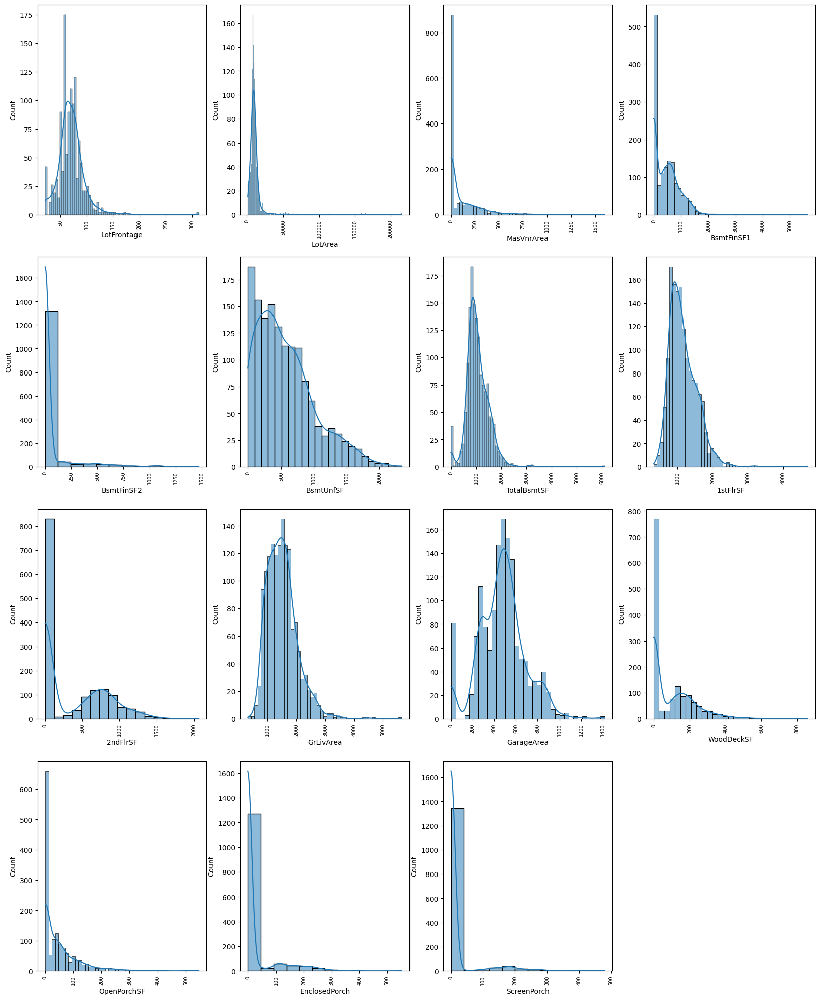

In [41]:
#distribution plot

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for cols in data_continuous:
  if cols != 'SalePrice':
    if plotnumber<=15 :     # as there are 15 columns in the data
        ax = plt.subplot(4,4,plotnumber)
        sns.histplot(data_continuous[cols],  kde=True)
        plt.xlabel(cols,fontsize=10)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
    plt.xticks(rotation=90,fontsize=7)
        #plt.xlabel(col)
plt.show()

### Box Plot

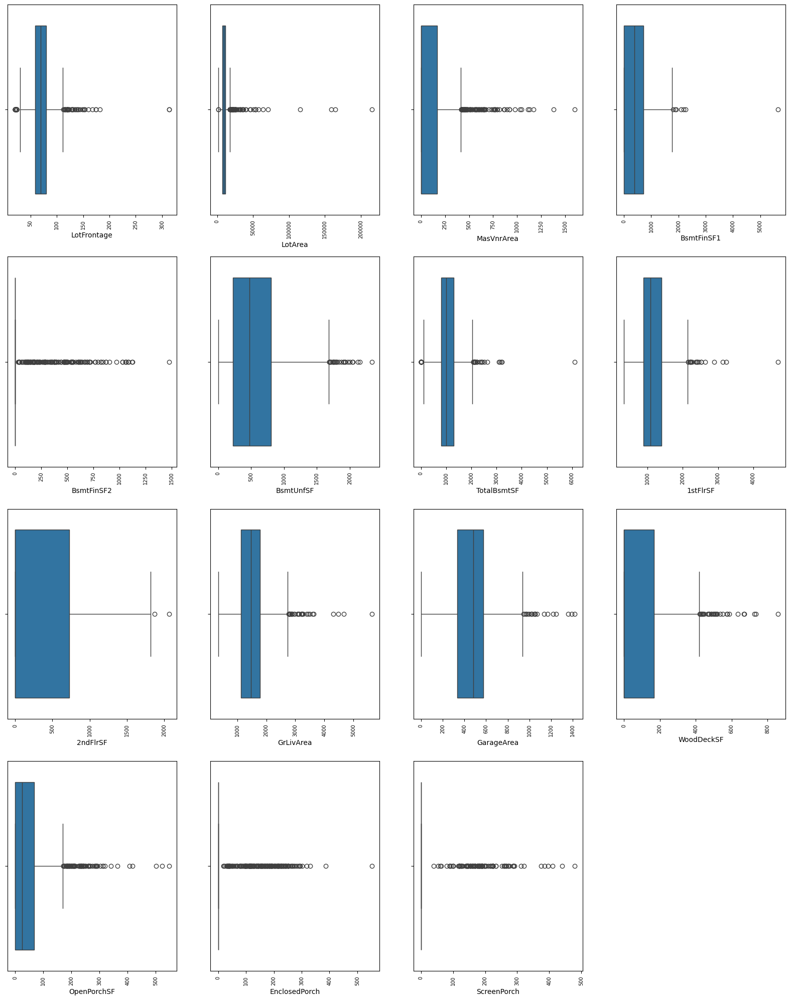

In [42]:
# prompt: iterate through data_continuous dataframe and plot box plot for each column in a grid

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for cols in data_continuous:
  if cols != 'SalePrice':
    if plotnumber<=15 :     # as there are 15 columns in the data
        ax = plt.subplot(4,4,plotnumber)
        sns.boxplot(x=data_continuous[cols])
        plt.xlabel(cols,fontsize=10)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
    plt.xticks(rotation=90,fontsize=7)
        #plt.xlabel(col)
plt.show()


In [43]:
# Create a dictionary to store the results for each column
outlier_info = {}

# Iterate through each column in your dataset
for cols in data_continuous.columns:
    # Calculate statistics for the current column
    Q1 = data_continuous[cols].quantile(0.25)
    Q3 = data_continuous[cols].quantile(0.75)
    IQR = Q3 - Q1

    # Calculate the count of values greater than max_limit and less than min_limit for the current column
    cnt_greater_max = (data_continuous[cols] > (Q3 + 1.5 * IQR)).sum()
    cnt_less_min = (data_continuous[cols] < (Q1 - 1.5 * IQR)).sum()

    # Calculate the percentage of values greater than max_limit and less than min_limit for the current column
    percent_greater_max = (cnt_greater_max / len(data)) * 100
    percent_less_min = (cnt_less_min / len(data)) * 100

    # Store the results in the dictionary
    outlier_info[cols] = {
        'count_greater_max': cnt_greater_max,
        'percent_greater_max': percent_greater_max,
        'count_less_min': cnt_less_min,
        'percent_less_min': percent_less_min
    }

# Print the results for each column
for column, info in outlier_info.items():
    print(f"Column: {column}")
    print(f"Count Greater Than max_limit: {info['count_greater_max']}")
    print(f"Percent Greater Than max_limit: {info['percent_greater_max']:.2f}%")
    print(f"Count Less Than min_limit: {info['count_less_min']}")
    print(f"Percent Less Than min_limit: {info['percent_less_min']:.2f}%")
    print()

Column: LotFrontage
Count Greater Than max_limit: 46
Percent Greater Than max_limit: 3.15%
Count Less Than min_limit: 42
Percent Less Than min_limit: 2.88%

Column: LotArea
Count Greater Than max_limit: 67
Percent Greater Than max_limit: 4.59%
Count Less Than min_limit: 2
Percent Less Than min_limit: 0.14%

Column: MasVnrArea
Count Greater Than max_limit: 96
Percent Greater Than max_limit: 6.58%
Count Less Than min_limit: 0
Percent Less Than min_limit: 0.00%

Column: BsmtFinSF1
Count Greater Than max_limit: 7
Percent Greater Than max_limit: 0.48%
Count Less Than min_limit: 0
Percent Less Than min_limit: 0.00%

Column: BsmtFinSF2
Count Greater Than max_limit: 167
Percent Greater Than max_limit: 11.44%
Count Less Than min_limit: 0
Percent Less Than min_limit: 0.00%

Column: BsmtUnfSF
Count Greater Than max_limit: 29
Percent Greater Than max_limit: 1.99%
Count Less Than min_limit: 0
Percent Less Than min_limit: 0.00%

Column: TotalBsmtSF
Count Greater Than max_limit: 24
Percent Greater Th

## Outlier Handling

In [44]:
from scipy import stats

# Initialize a dictionary to store outlier bounds for each column
outlier_bounds = {}

# Iterate through each column in your dataset
for cols in data_continuous.columns:
    IQR = stats.iqr(data_continuous[cols], interpolation='midpoint')
    Q1 = data_continuous[cols].quantile(0.25)
    Q3 = data_continuous[cols].quantile(0.75)

    # Calculate the lower and upper bounds for potential outliers
    min_limit = Q1 - 1.5 * IQR
    max_limit = Q3 + 1.5 * IQR

    # Store the outlier bounds in the dictionary
    outlier_bounds[cols] = {'min_limit': min_limit, 'max_limit': max_limit}

In [45]:
# if any value in the column is less than min_limit, replace with median. And if any value is greater than max_limit, replace with median.
for cols in data_continuous.columns:
  if cols != 'SalePrice':
    data_continuous[cols] = np.where(data_continuous[cols] < outlier_bounds[cols]['min_limit'], data_continuous[cols].median(), data_continuous[cols])
    data_continuous[cols] = np.where(data_continuous[cols] > outlier_bounds[cols]['max_limit'], data_continuous[cols].median(), data_continuous[cols])

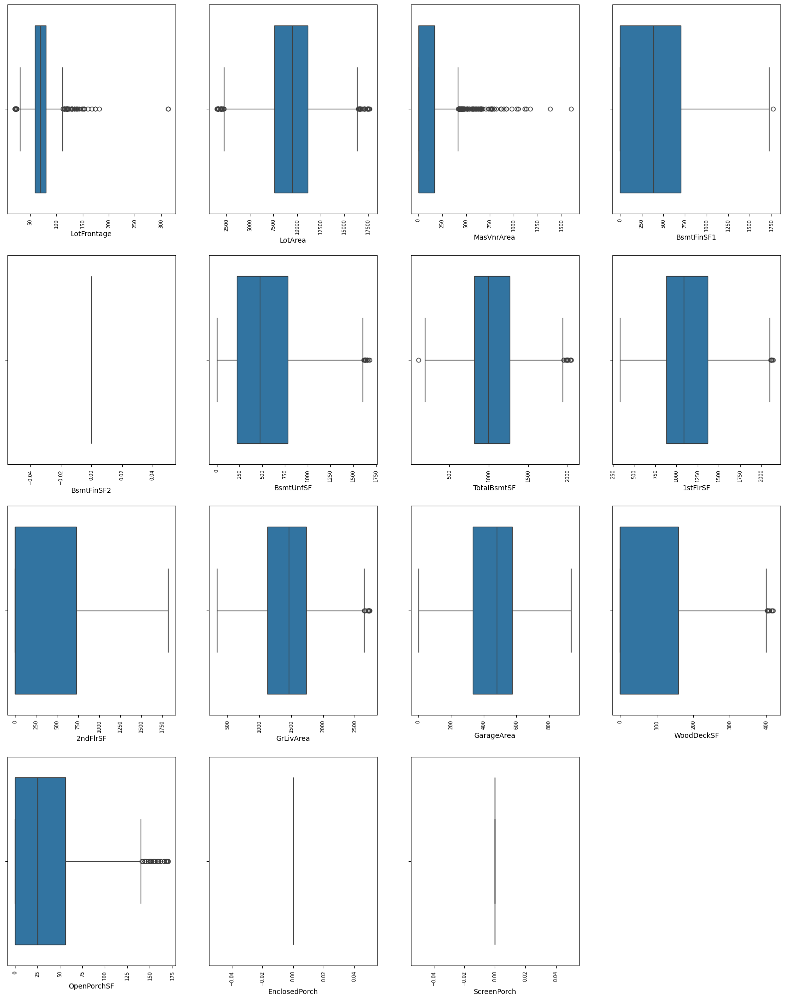

In [46]:
# Visualize data after outlier handling with mediam values

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for cols in data_continuous:
  if cols != 'SalePrice':
    if plotnumber<=15 :     # as there are 15 columns in the data
        ax = plt.subplot(4,4,plotnumber)
        sns.boxplot(x=data_continuous[cols])
        plt.xlabel(cols,fontsize=10)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
    plt.xticks(rotation=90,fontsize=7)
        #plt.xlabel(col)
plt.show()


In [47]:
data_continuous.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   LotFrontage    1201 non-null   float64
 1   LotArea        1460 non-null   float64
 2   MasVnrArea     1452 non-null   float64
 3   BsmtFinSF1     1460 non-null   float64
 4   BsmtFinSF2     1460 non-null   float64
 5   BsmtUnfSF      1460 non-null   float64
 6   TotalBsmtSF    1460 non-null   float64
 7   1stFlrSF       1460 non-null   float64
 8   2ndFlrSF       1460 non-null   float64
 9   GrLivArea      1460 non-null   float64
 10  GarageArea     1460 non-null   float64
 11  WoodDeckSF     1460 non-null   float64
 12  OpenPorchSF    1460 non-null   float64
 13  EnclosedPorch  1460 non-null   float64
 14  ScreenPorch    1460 non-null   float64
 15  SalePrice      1460 non-null   int64  
dtypes: float64(15), int64(1)
memory usage: 182.6 KB


## Bivariate analysis

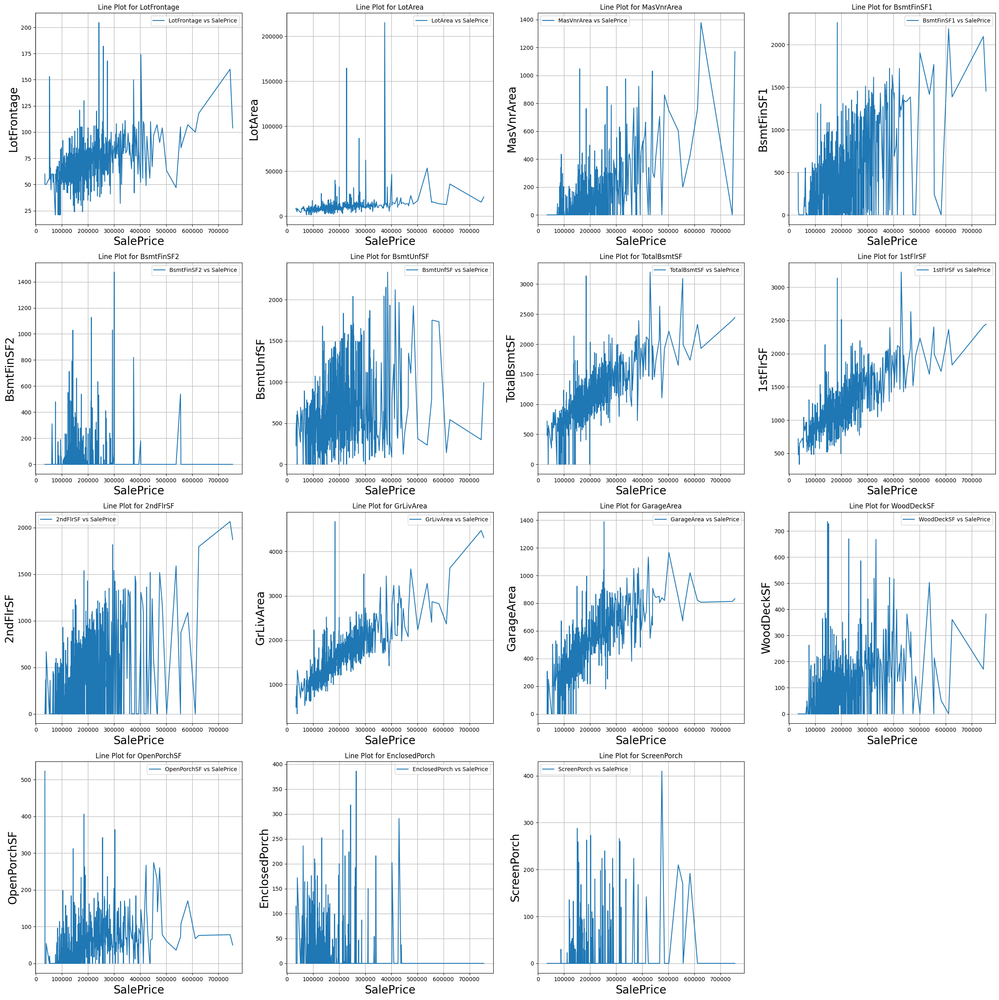

In [48]:
plt.figure(figsize = (25, 25), facecolor = 'white')
plotnumber = 1
for column in data_continuous[:-1]:
    if plotnumber <= 15:
        plt.subplot(4,4,plotnumber)
        sns.lineplot(x = data['SalePrice'], y= data[column], ci = None, label = f"{column} vs SalePrice")

        plt.title(f"Line Plot for {column}")
        plt.xlabel('SalePrice', fontsize = 20)
        plt.ylabel(column, fontsize = 20)
        plotnumber += 1
        plt.grid(True)

plt.tight_layout()
plt.legend()
plt.show()

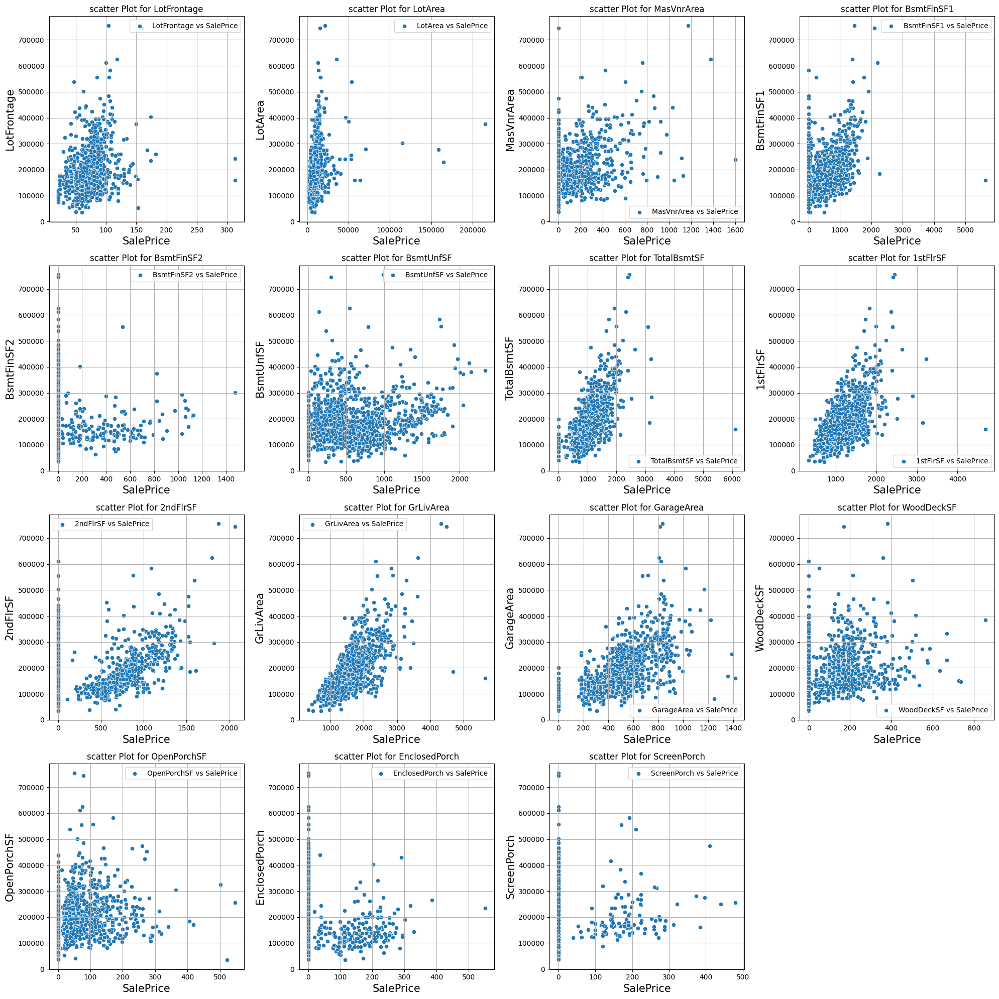

In [49]:
plt.figure(figsize = (20, 20), facecolor = 'white')
plotnumber = 1
for column in data_continuous[:-1]:
    if plotnumber <= 15:
        plt.subplot(4,4,plotnumber)
        sns.scatterplot(x = data[column], y= data['SalePrice'],label = f"{column} vs SalePrice")

        plt.title(f"scatter Plot for {column}")
        plt.xlabel('SalePrice', fontsize = 15)
        plt.ylabel(column, fontsize = 15)
        plotnumber += 1
        plt.grid(True)

plt.tight_layout()
plt.legend()
plt.show()

#### Bivariate analysis of datetime column relation with SalePrice

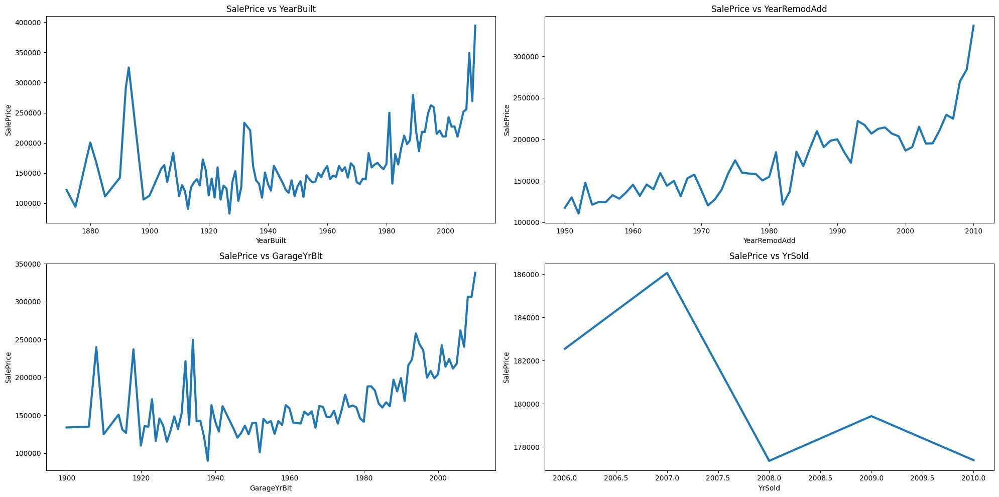

In [50]:
# Plotting how every  datetime feature correlate with the "target"

datetime_columns = ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

plt.figure(figsize=(20, 10))

for i, cols in enumerate(datetime_columns, 1):
    plt.subplot(2, 2, i)
    sns.lineplot(x=data[cols], y=data['SalePrice'], ci=None, linewidth=3)
    plt.xlabel(cols)
    plt.ylabel('SalePrice')
    plt.title(f'SalePrice vs {cols}')

plt.tight_layout()
plt.show()

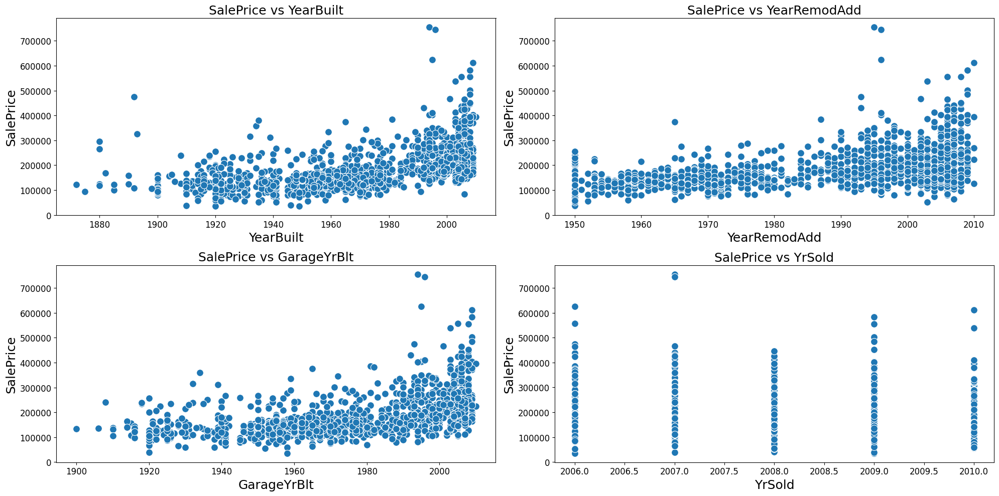

In [51]:
# Plotting how every  datetime feature correlate with the "target"

import seaborn as sns
import matplotlib.pyplot as plt

datetime_columns = ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

plt.figure(figsize=(20, 10))

for i, cols in enumerate(datetime_columns, 1):
    plt.subplot(2, 2, i)
    sns.scatterplot(x=data[cols], y=data['SalePrice'], s=100)  # s parameter controls marker size
    plt.xlabel(cols, fontsize=18)
    plt.ylabel('SalePrice', fontsize=18)
    plt.title(f'SalePrice vs {cols}', fontsize=18)

    # Set fontsize for tick labels
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()



### Insights from datatime relation with target variable

1. The strong positive correlation close to 1 between 'SalePrice' and 'YearBuilt', 'YearRemodAdd', and 'GarageYrBlt' suggests that as these aspects related to the property's history and construction time increase, the home's selling price tends to rise as well.


2. Time and Sale Price: The small negative correlation near 0 between 'SalePrice' and 'YrSold' hints at a subtle trend—when the sale year increases, there's a slight tendency for the selling price to decrease, although this relationship is not very pronounced.


3. Predictive Power: The moderate to strong correlation values imply that 'YearBuilt', 'YearRemodAdd', and 'GarageYrBlt' could serve as promising predictors for estimating 'SalePrice'. Essentially, changes in these features are associated with noticeable
changes in the property's selling price. However, keep in mind that correlation doesn't prove causation, and a comprehensive analysis should consider various factors.

### Multivariate Analysizing

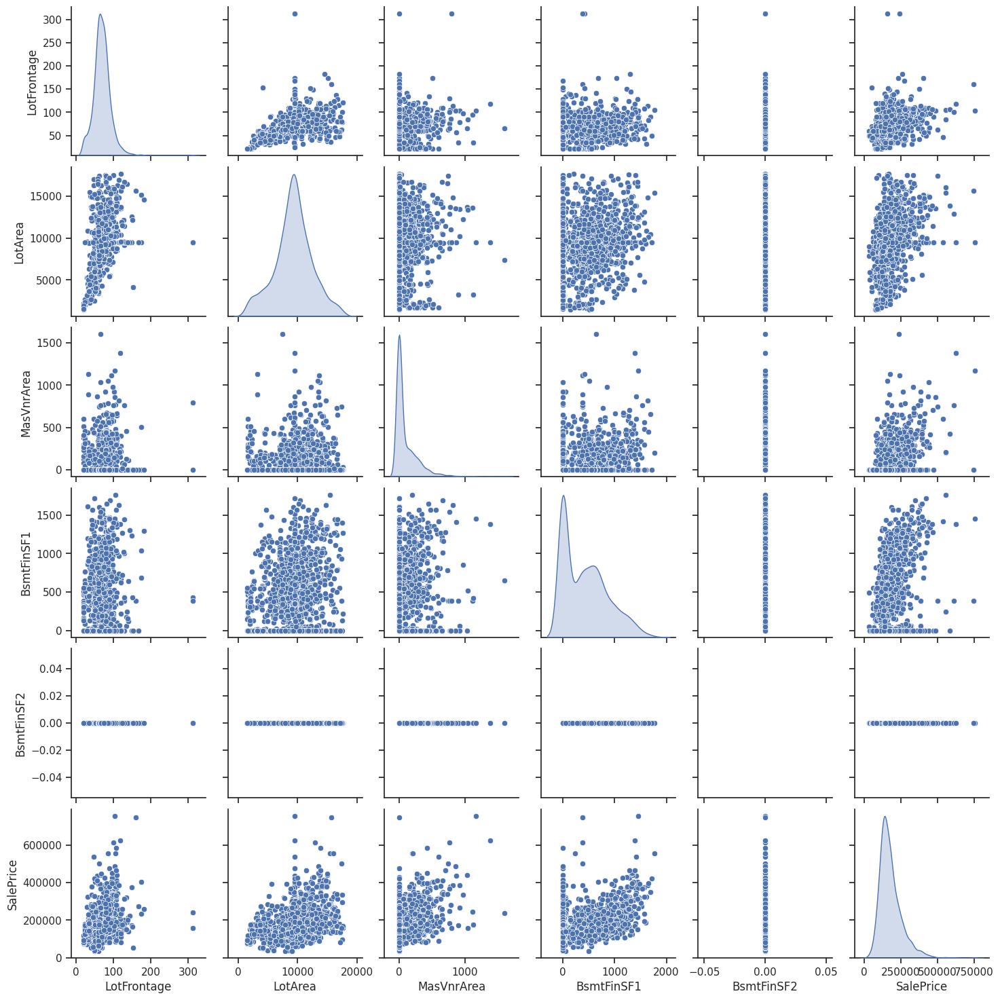

In [52]:
## Multivariate Analysizing

# numerical_continuous_cols = [col for col in numerical_cols if col not in numerical_discrete_cols and col not in datetime_cols and col != 'Id']
# numerical_continuous_cols
vars = ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'SalePrice']
data_subset = data_continuous[vars]

# Use pairplot
sns.set(style='ticks')
sns.pairplot(data_subset, diag_kind='kde')
plt.show()

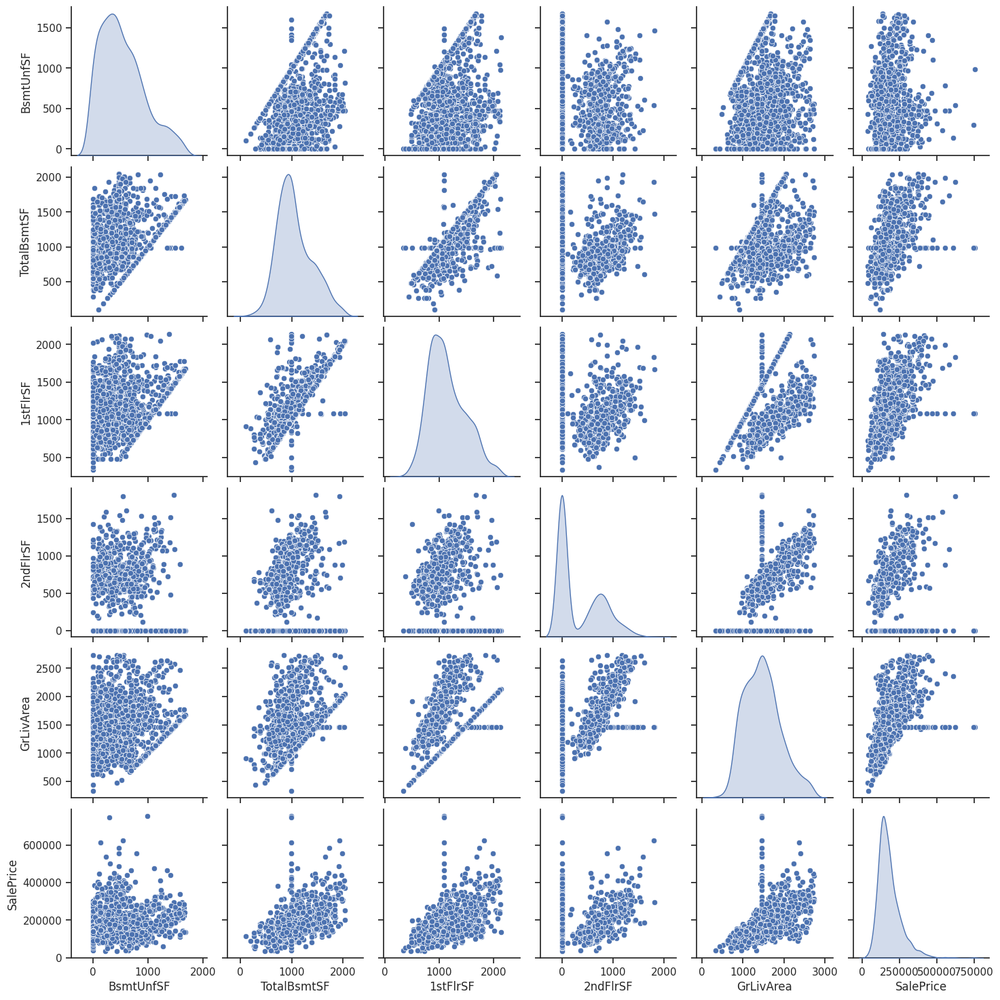

In [53]:
vars = ['BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'SalePrice']
data_subset = data_continuous[vars]

# Use pairplot
sns.set(style='ticks')
sns.pairplot(data_subset, diag_kind='kde')
plt.show()

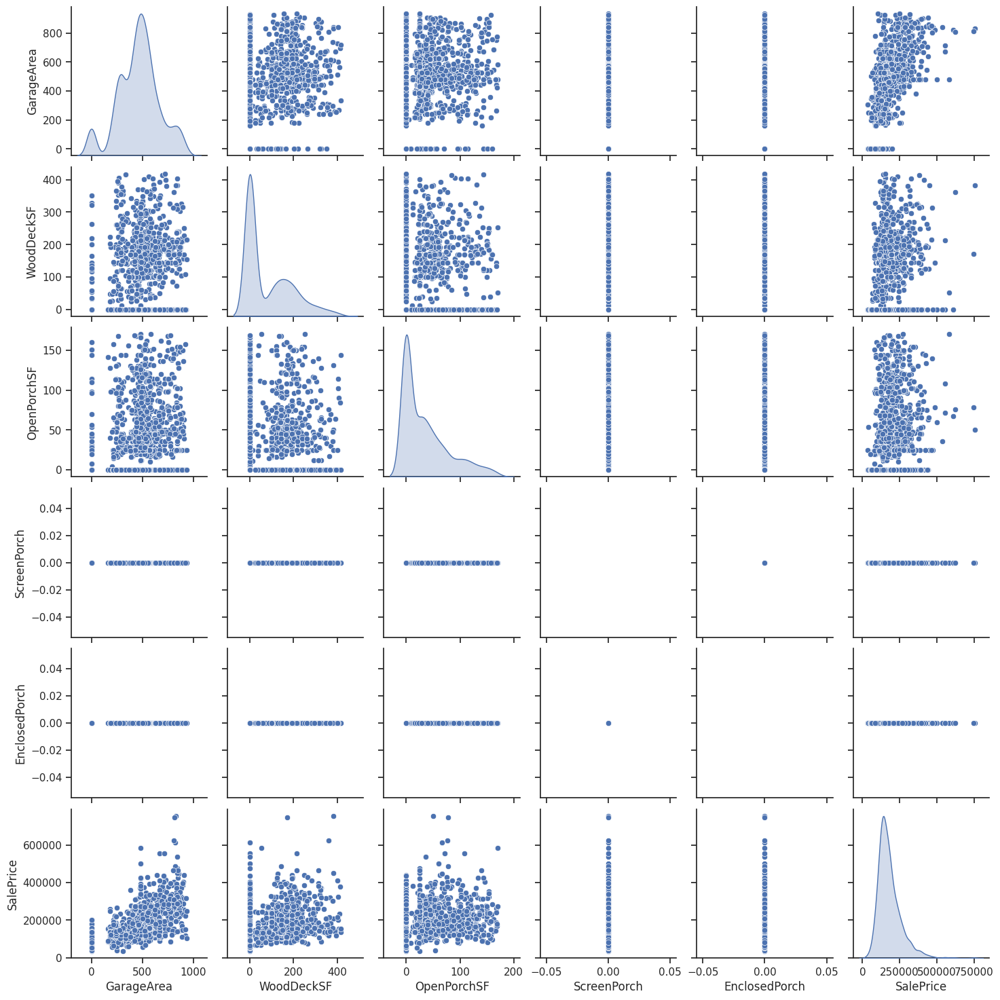

In [54]:
vars = ['GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'ScreenPorch', 'EnclosedPorch', 'SalePrice']
data_subset = data_continuous[vars]

# Use pairplot
sns.set(style='ticks')
sns.pairplot(data_subset, diag_kind='kde')
plt.show()

## Exploring Engineered Features relationship with target variable

In [55]:
# Calculate the total square footage
data_continuous['TotalSqrFt'] = data_continuous['1stFlrSF'] + data_continuous['2ndFlrSF'] + data_continuous['GrLivArea'] + data_continuous['WoodDeckSF']
data_continuous['TotalPorchArea'] = data_continuous['OpenPorchSF'] + data_continuous['EnclosedPorch'] + data_continuous['ScreenPorch']
data_datetime['NumYearsbfSold'] = data_datetime['YrSold'] - data_datetime['YearBuilt']
data_datetime['TimesinceRemod'] = data_datetime['YearRemodAdd'] - data_datetime['YearBuilt']

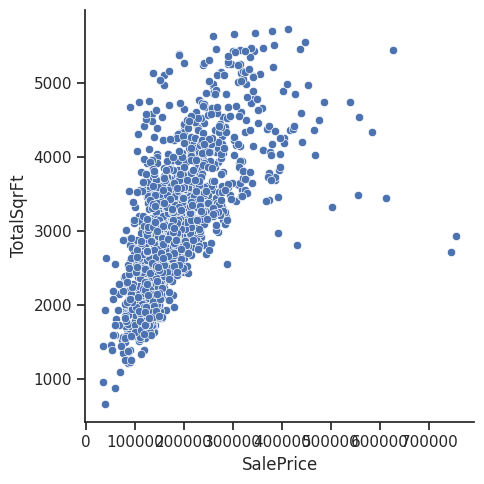

In [56]:
## Multivariate Analyses of engineered features and target variable

# Analyzing TotalSqrFt and House Price
sns.relplot(x='SalePrice',y='TotalSqrFt',data=data_continuous)

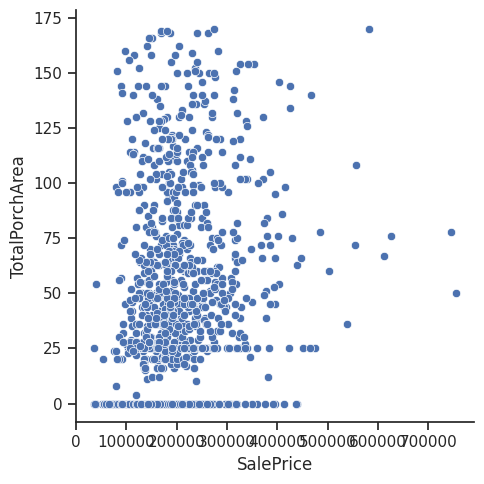

In [57]:
## Multivariate Analyses of engineered features and target variable

# Analyzing TotalSqrFt and Sales
sns.relplot(x='SalePrice',y='TotalPorchArea',data=data_continuous)

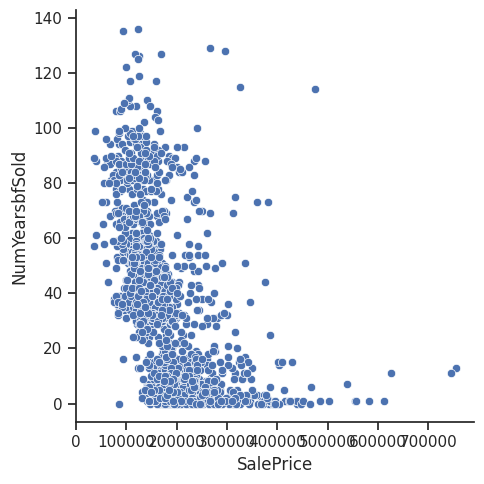

In [58]:
# Analyzing number of years since the sale of the house

sns.relplot(x='SalePrice',y='NumYearsbfSold',data=data_datetime)

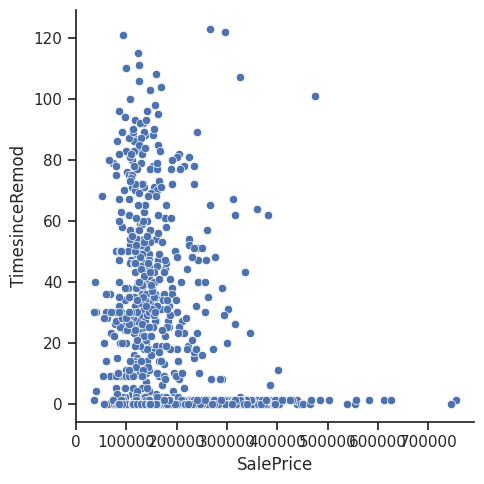

In [59]:
# Analyzing time since previous remodelling and Sales price

sns.relplot(x='SalePrice',y='TimesinceRemod',data=data_datetime)

### Discreet Variable EDA

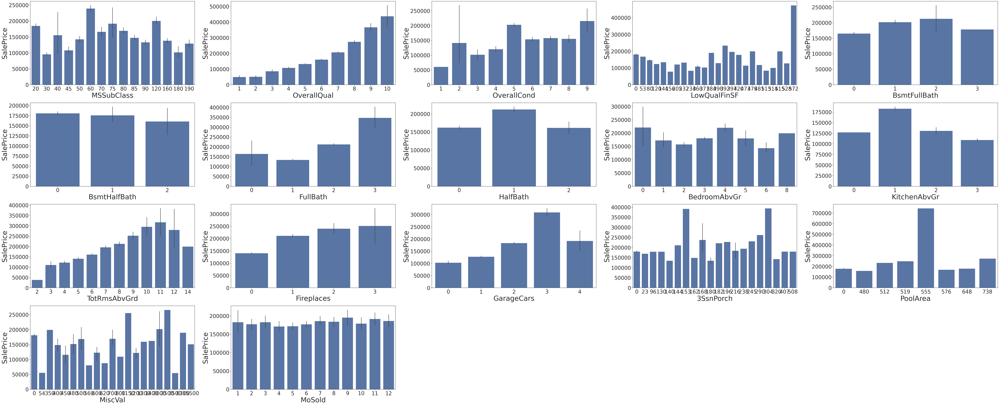

In [60]:
# Plotting how every  discrete feature correlate with the "target"

plt.figure(figsize=(80, 80), facecolor='white')  # Canvas size
plotnumber = 1  # Count variable

for cols in data_discrete.columns:
    if cols != 'SalePrice':
        if plotnumber <= 50:
            ax = plt.subplot(10, 5, plotnumber)
            sns.barplot(x=data_discrete[cols], y=data_discrete['SalePrice'])
            plt.xlabel(cols, fontsize=40)
            plt.ylabel('SalePrice', fontsize=40)
            plt.xticks(fontsize=30)  # Increase x-axis tick font size
            plt.yticks(fontsize=30)  # Increase y-axis tick font size
            plotnumber += 1

plt.tight_layout()
plt.show()

### Categorical Variable EDA

In [61]:
plt.figure(figsize=(100, 100), facecolor='white')  # Canvas size
plotnumber = 1  # Count variable

for cols in data_categorical.columns:
    if cols != 'SalePrice':
        if plotnumber <= 50:
            ax = plt.subplot(10, 5, plotnumber)
            sns.barplot(x=data_categorical[cols], y=data_categorical['SalePrice'])
            plt.xlabel(cols, fontsize=40)
            plt.ylabel('SalePrice', fontsize=40)
            plt.xticks(fontsize=30)  # Increase x-axis tick font size
            plt.yticks(fontsize=30)  # Increase y-axis tick font size
            plotnumber += 1

plt.tight_layout()
plt.show()

### INSIGHTS from bivariate analysis


Zoning types play a crucial role in SalePrices. 'FV' homes command higher prices, 'RL' zoning has a positive influence, 'RM' and 'RH' show similar effects, while 'C (all)' has the least impact. Road access is a significant factor, with 'Pave' leading to higher prices, and 'Grvl' being the second most impactful. Alley type also influences SalePrices, with 'Pave' demonstrating a strong positive link, while 'Grvl' has a slightly lesser impact. Lot characteristics matter, as seen with 'IR2' lots having the strongest impact, followed by 'IR3,' 'IR1,' and 'Reg' lots. The contour of the land also impacts SalePrices, with 'HLS' (hillside) having the highest impact, followed by 'Low,' and 'Bnk' having the least impact.

Utilities and configuration contribute to variations in SalePrices. 'AllPub' (All Public Utilities) has a strong positive impact, while 'NoSeWa' (No Separate Water and Electricity) has a moderate impact. Lot configuration plays a role, with 'CulDSac' having the highest impact, 'FR3' the second-highest, and 'Inside,' 'FR2,' and 'Corner' configurations showing similar impacts. Slope matters, with 'Gtl' (gentle slope) and 'Mod' (moderate slope) having the same impact, while 'Sev' (severe slope) has a slightly higher impact. Certain conditions substantially impact SalePrices, including 'PosA,' 'PosN,' and 'RRNn.'

Building characteristics significantly impact SalePrices. The type of building, such as '1Fam' (Single-family homes) and 'TwnhsE' (Townhouses inside a building), exhibits the highest impact. House styles also influence prices, with '2Story' and '2.5Fin' potentially leading to higher prices. Roof styles impact SalePrices, with 'Hip' and 'Shed' exhibiting the highest prices. The choice of roof material matters, with 'WdShngl' (Wood shingles) leading to higher SalePrices. Exterior materials, including 'Stone' and 'ImStucc,' contribute to the highest prices. Masonry veneer types, such as 'Stone' and 'BrkFace,' impact SalePrices. Finally, the quality of exterior features and foundation plays a role, with 'Ex' (Excellent quality) and 'PConc' (Poured Concrete) having the highest impacts, respectively.

## Summary Data Analysis

Residential Low Density dominates the dataset, covering 79%, indicating a significant portion designated for low-density residential use, often allowing for single-family homes with larger lots. Paved street access is prevalent (99%), ensuring better durability and higher traffic capacity, contributing to a well-connected living environment. For alleys, 55% being paved contributes to smoother transportation within neighborhoods.

Regular-shaped lots (63%) and level land contour (90%) are predominant, facilitating easier development and simplifying the development process. All public utilities are available for over 99% of properties, reflecting a well-supported living environment. 72% of properties have an "Inside" lot configuration, catering to various preferences among potential buyers or renters.

95% of properties have a gentle slope, facilitating more straightforward development and diverse landscaping designs. 84% are single-family detached dwellings (1Fam), with 49% having a one-story style, suggesting a preference for single-level living. Gable roofs dominate (78%), while hip roofs represent 20%, indicating a diverse roof style distribution. 60% have no masonry veneer, suggesting diversity in exterior materials used for buildings.

62% have an average exterior material quality (ExterQual - TA), and 88% have an average present condition (ExterCond - TA). 44% have a poured concrete foundation, suggesting a significant portion with a sturdy foundation. Majority have a basement with typical height (46% - BsmtQual). 92% have a basement in typical condition (BsmtCond), and 67% have no basement exposure (BsmtExposure). 30% have an unfinished basement finished area (BsmtFinType1), and 88% have an unfinished second finished area (BsmtFinType2).

98% have a gas forced warm air furnace for heating, with 51% having excellent heating quality and condition (HeatingQC). 93% have central air conditioning, indicating modern and effective cooling systems. 91% have a standard circuit breaker electrical system, reflecting modern electrical standards. 65% have no basement full bathrooms, and 94% have no half bathroom in the basement.

53% have two full bathrooms above grade, and 54% have one half bathroom above grade. 95% have one kitchen, with 50% having kitchens with typical/average quality (KitchenQual). 93% have a typical functionality rating, meeting standard expectations for functionality. 47% have no fireplaces, and 49% have fireplaces with good quality (FireplaceQu).

63% have attached garages (GarageType), 44% have unfinished interior garages (GarageFinish), and 46% have a garage with a capacity for two cars (GarageCars). 95% have garages with typical/average quality (GarageQual), and 96% have garages with typical/average condition (GarageCond).

92% have a paved driveway, offering a smooth and finished appearance. Pool quality information is largely unavailable. The majority of properties have fences with minimum privacy (MnPrv). Sheds are prevalent (91%), commonly used for storage and various purposes. Properties sold in 2009 are the highest (23%), with 2010 being the lowest (12%). 87% sold through Warranty Deed (SaleType), and 82% under normal sale conditions (SaleCondition).

## Data Preprocessing

### Missing values handling



In [ ]:
# cheking null values
data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [62]:
#Handling missing values of continuous variables
# Replace missing values with the median

data_numerical.loc[data_numerical['LotFrontage'].isnull()==True,'LotFrontage']=np.median(data_numerical.LotFrontage.dropna(axis=0))

# Replace missing values with 0
data_numerical["MasVnrArea"].fillna(0, inplace=True)

# Replace missing values with 0
data_numerical["GarageYrBlt"].fillna(0, inplace=True)

In [63]:
data_numerical.isnull().sum()

Id               0
MSSubClass       0
LotFrontage      0
LotArea          0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
TotRmsAbvGrd     0
Fireplaces       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
SalePrice        0
dtype: int64

In [64]:
# Handling categorial Missing values

for col in ('Alley', 'PoolQC', 'MiscFeature', 'Fence', 'FireplaceQu'): # Cannot replace with mode. NA implies data not applicable for that variable
  data_categorical[col] = data_categorical[col].fillna('Missing')

for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2','GarageType', 'GarageFinish', 'GarageQual', 'GarageCond'): # Cannot replace with mode. NA implies data not applicable for that variable
    data_categorical[col] = data_categorical[col].fillna('Missing')

#Electrical
data_categorical['Electrical'] = data_categorical['Electrical'].fillna(data_categorical['Electrical'].mode()[0]) # Replaace with mode

#MasVnrType
data_categorical['MasVnrType'] = data_categorical['MasVnrType'].fillna('None') # None corresponds to house without a Mansonry

In [65]:
data_categorical.isnull().sum()

MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
MiscFeature      0
SaleType         0
SaleCondition    0
SalePrice        0
dtype: int64

## Encoding categorical columns

In [66]:
data_categorical.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'SalePrice'],
      dtype='object')

In [67]:
categorical_col = []  # list

for column in data.columns:  # for loop to access columns from the dataset
    if data[column].dtype == object and len(data[column].unique()) <= 50:  # checking datatype whether datatype is object/string and number of unique labels in the columns less than 50
        categorical_col.append(column)  # appending those columns in the list who satisfy the condition

        unique_values = data[column].unique()  # get unique values
        distribution = data[column].value_counts(normalize=True) * 100  # calculate distribution

        print(f"{column} : {unique_values}")
        print(f"Distribution:")
        print(distribution)
        print("====================================")

MSZoning : ['RL' 'RM' 'C (all)' 'FV' 'RH']
Distribution:
RL         78.835616
RM         14.931507
FV          4.452055
RH          1.095890
C (all)     0.684932
Name: MSZoning, dtype: float64
Street : ['Pave' 'Grvl']
Distribution:
Pave    99.589041
Grvl     0.410959
Name: Street, dtype: float64
Alley : [nan 'Grvl' 'Pave']
Distribution:
Grvl    54.945055
Pave    45.054945
Name: Alley, dtype: float64
LotShape : ['Reg' 'IR1' 'IR2' 'IR3']
Distribution:
Reg    63.356164
IR1    33.150685
IR2     2.808219
IR3     0.684932
Name: LotShape, dtype: float64
LandContour : ['Lvl' 'Bnk' 'Low' 'HLS']
Distribution:
Lvl    89.794521
Bnk     4.315068
HLS     3.424658
Low     2.465753
Name: LandContour, dtype: float64
Utilities : ['AllPub' 'NoSeWa']
Distribution:
AllPub    99.931507
NoSeWa     0.068493
Name: Utilities, dtype: float64
LotConfig : ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
Distribution:
Inside     72.054795
Corner     18.013699
CulDSac     6.438356
FR2         3.219178
FR3         0.273973


In [68]:
processed_data_categorical = data_categorical.drop(columns=['Utilities', 'Street','SalePrice'], axis=1) # contain mostly single variable, without variations

In [69]:
# using labelEncoder to convert objects
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
encoder = LabelEncoder()

# Loop through categorical columns
for cols in processed_data_categorical.columns.values.flatten():
    # Apply label encoding to the column
    processed_data_categorical[cols] = encoder.fit_transform(processed_data_categorical[cols])

In [70]:
processed_data_categorical.head(4)

,MSZoning,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,3,1,3,3,4,0,5,2,2,0,5,1,1,12,13,1,2,4,2,2,4,4,2,6,1,0,1,4,2,6,3,1,2,5,5,2,3,2,1,8,4
1,3,1,3,3,2,0,24,1,2,0,2,1,1,8,8,2,3,4,1,2,4,1,0,6,1,0,1,4,3,6,5,1,2,5,5,2,3,2,1,8,4
2,3,1,0,3,4,0,5,2,2,0,5,1,1,12,13,1,2,4,2,2,4,3,2,6,1,0,1,4,2,6,5,1,2,5,5,2,3,2,1,8,4
3,3,1,0,3,0,0,6,2,2,0,5,1,1,13,15,2,3,4,0,4,1,4,0,6,1,2,1,4,2,6,2,5,3,5,5,2,3,2,1,8,0


## Feature selection

<Axes: >

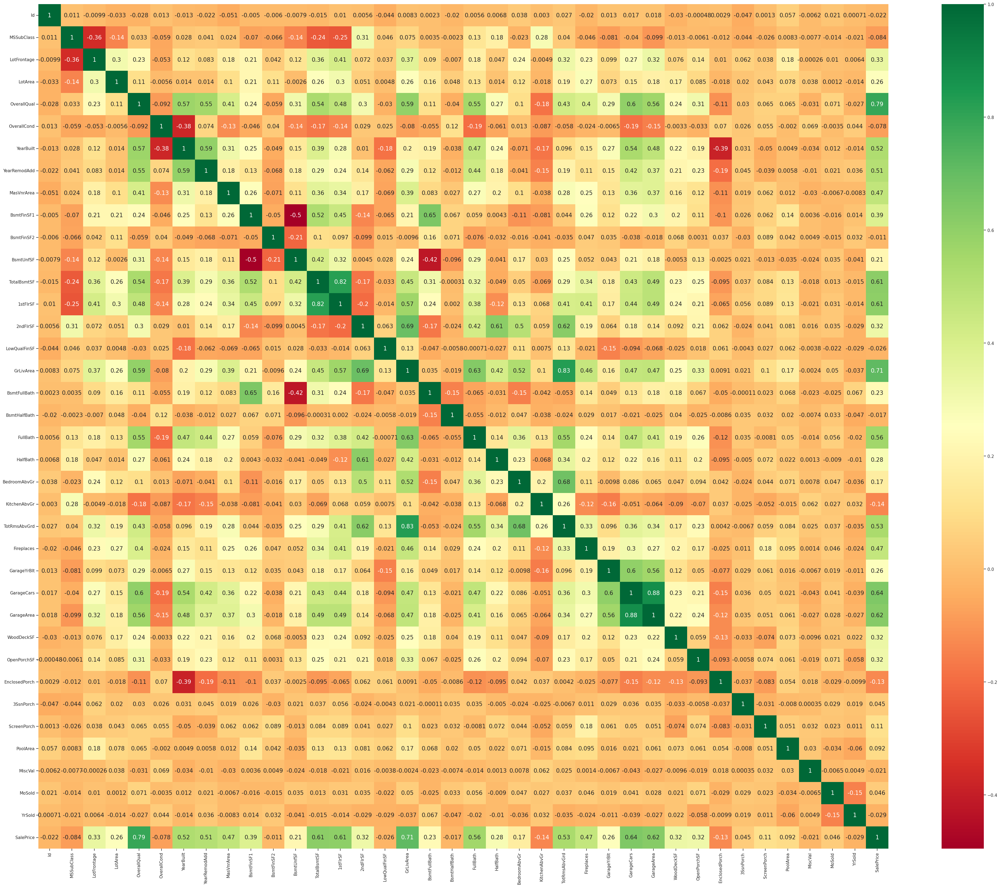

In [71]:
## Checking correlation

plt.figure(figsize=(50, 40))#canvas size
sns.heatmap(data_numerical.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":15})#plotting heat map to check correlation

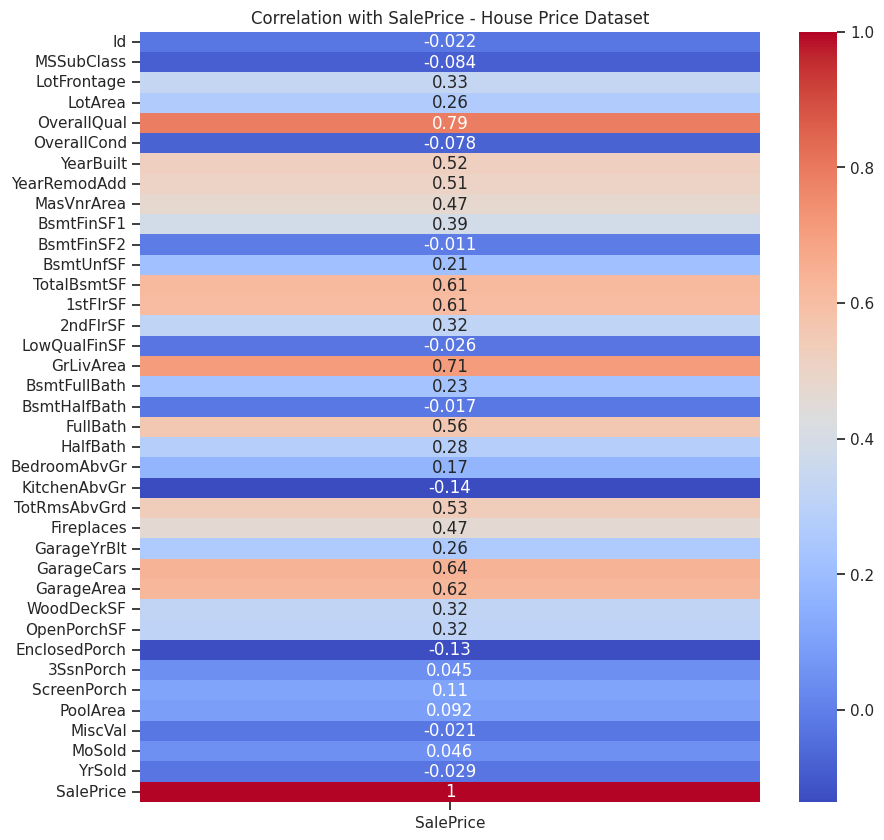

In [ ]:
correlation = data_numerical.corr()[['SalePrice']]
plt.figure(figsize=(10, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title("Correlation with SalePrice - House Price Dataset")
plt.show()

In [ ]:
data_numerical.corr()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.011156,-0.009921,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.051071,-0.005024,-0.005968,-0.007940,-0.015415,0.010496,0.005590,-0.044230,0.008273,0.002289,-0.020155,0.005587,0.006784,0.037719,0.002951,0.027239,-0.019772,0.013491,0.016570,0.017634,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,-0.021917
MSSubClass,0.011156,1.000000,-0.356718,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.023573,-0.069836,-0.065649,-0.140759,-0.238518,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.040380,-0.045569,-0.080997,-0.040110,-0.098672,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.009921,-0.356718,1.000000,0.304522,0.234812,-0.053281,0.116685,0.083348,0.178469,0.214367,0.042463,0.124098,0.363472,0.413773,0.072388,0.037469,0.368007,0.090343,-0.006979,0.180534,0.047222,0.236840,-0.004905,0.320518,0.233221,0.099196,0.269539,0.323511,0.075542,0.137014,0.010287,0.061945,0.037655,0.180819,-0.000255,0.010451,0.006380,0.334771
LotArea,-0.033226,-0.139781,0.304522,1.000000,0.105806,-0.005636,0.014228,0.013788,0.103321,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,0.072599,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,-0.028365,0.032628,0.234812,0.105806,1.000000,-0.091932,0.572323,0.550684,0.407252,0.239666,-0.059119,0.308159,0.537808,0.476224,0.295493,-0.030429,0.593007,0.111098,-0.040150,0.550600,0.273458,0.101676,-0.183882,0.427452,0.396765,0.288998,0.600671,0.562022,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,0.012609,-0.059316,-0.053281,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.125694,-0.046231,0.040229,-0.136841,-0.171098,-0.144203,0.028942,0.025494,-0.079686,-0.054942,0.117821,-0.194149,-0.060769,0.012980,-0.087001,-0.057583,-0.023820,-0.006515,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,-0.012713,0.027850,0.116685,0.014228,0.572323,-0.375983,1.000000,0.592855,0.311600,0.249503,-0.049107,0.149040,0.391452,0.281986,0.010308,-0.183784,0.199010,0.187599,-0.038162,0.468271,0.242656,-0.070651,-0.174800,0.095589,0.147716,0.272029,0.537850,0.478954,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,-0.021998,0.040581,0.083348,0.013788,0.550684,0.073741,0.592855,1.000000,0.176529,0.128451,-0.067759,0.181133,0.291066,0.240379,0.140024,-0.062419,0.287389,0.119470,-0.012337,0.439046,0.183331,-0.040581,-0.149598,0.191740,0.112581,0.146357,0.420622,0.371600,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,-0.051071,0.023573,0.178469,0.103321,0.407252,-0.125694,0.311600,0.176529,1.000000,0.261256,-0.071330,0.113862,0.360067,0.339850,0.173800,-0.068628,0.388052,0.083010,0.027403,0.272999,0.199108,0.102775,-0.038450,0.279568,0.247015,0.132696,0.361945,0.370884,0.159991,0.122528,-0.109907,0.019144,0.062248,0.011928,-0.029512,-0.006723,-0.008317,0.472614
BsmtFinSF1,-0.005024,-0.069836,0.214367,0.214103,0.239666,-0.046231,0.249503,0.128451,0.261256,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.115843,0.224054,0.296970,0.204306,0.111761,-0.102303,0.02645

In [75]:
processed_data_numerical = data_numerical.drop(columns=['Id'])

In [ ]:
processed_data_numerical.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

## Scaling

**Not required for Advanced Regression Algorithms**

In [72]:
feature_engineered_vars = pd.concat([data_continuous[['TotalSqrFt', 'TotalPorchArea']],
                                        data_datetime[['NumYearsbfSold', 'TimesinceRemod']]], axis=1)

feature_engineered_vars.head(4)

,TotalSqrFt,TotalPorchArea,NumYearsbfSold,TimesinceRemod
0,3420.0,61.0,5,0
1,2822.0,0.0,31,0
2,3572.0,42.0,7,1
3,3434.0,35.0,91,55


In [73]:
feature_engineered_vars.isnull().sum()

TotalSqrFt        0
TotalPorchArea    0
NumYearsbfSold    0
TimesinceRemod    0
dtype: int64

### **Approach 1: Using all variables**

Building a model by incorporating all variable features offers a comprehensive perspective, ensuring that every potential factor influencing the outcome is considered. This approach allows for the capture of complex relationships and interactions within the data, providing a nuanced understanding of underlying patterns. It avoids information loss that may occur with manual feature selection and leverages algorithms capable of automatic variable selection. However, there are trade-offs to consider, such as the increased model complexity, interpretability and computational efficiency.

## Model Creation

In [76]:
combined_processed_data1 = pd.concat([processed_data_categorical, processed_data_numerical],axis=1)

combined_processed_data2 = pd.concat([combined_processed_data1, feature_engineered_vars],axis=1)

In [ ]:
combined_processed_data1.shape

(1460, 78)

In [ ]:
combined_processed_data2.shape

(1460, 82)

In [77]:
# seperating targets and predictors
X=combined_processed_data1.iloc[:,:-1]

In [78]:
X2=combined_processed_data2.iloc[:,:-1] # Splitting of data with engineered features
X2.shape

(1460, 81)

In [79]:
# Independent and dependent variable creation
y=combined_processed_data1.SalePrice ## y is output

### Split features

In [80]:
# Step 1 Traning and testing data creation

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=4)

In [81]:
X_train.shape

(1168, 77)

In [82]:
y_test.shape

(292,)

# Model Building

## Decision Tree

In [83]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=14)

In [84]:
from sklearn.tree import DecisionTreeRegressor #importing decision tree from sklearn.tree

dt=DecisionTreeRegressor() # object creation for decision tree

dt.fit(X_train,y_train) # training the model

DecisionTreeRegressor()

In [85]:
y_pred_dt = dt.predict(X_test) # prediction

In [86]:
# Checking Accuracy score
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,mean_absolute_percentage_error
import math

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_dt):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_dt):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_dt):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_dt):.5f}')

Test Mean Squared Error: 1248341448.68767
Test Mean Absolute Error: 24740.40822
Test Mean Absolute Percentage Error: 0.14337
R2 Score: 0.79942


In [87]:
y_train_predict = dt.predict(X_train)
print(f'R2 Score: {r2_score(y_train, y_train_predict):.2f}')

R2 Score: 1.00


### Hyper paramter tuning for Decision tree

In [88]:
from sklearn.model_selection import GridSearchCV

In [89]:
params = {
    "criterion":('friedman_mse', 'poisson', 'squared_error', 'absolute_error'), #quality of split
    "splitter":("best", "random"), # searches the features for a split
    "max_depth":(list(range(1, 20))), #depth of tree range from 1 to 19
    "min_samples_split":[2,20],    #the minimum number of samples required to split internal node
    "min_samples_leaf":list(range(1, 20)),#minimum number of samples required to be at a leaf node,we are passing list which is range from 1 to 19
}

tree_reg = DecisionTreeRegressor(random_state=3)#object creation for decision tree with random state 3
tree_cv = GridSearchCV(tree_reg, params, scoring="neg_mean_squared_error", n_jobs=-1, verbose=1, cv=3)
#passing model to gridsearchCV ,
#tree_clf-->model
#params---->hyperparametes(dictionary we created)
#scoring--->performance matrix to check performance
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.
#verbose=Controls the verbosity: the higher, the more messages.
#>1 : the computation time for each fold and parameter candidate is displayed;
#>2 : the score is also displayed;
#>3 : the fold and candidate parameter indexes are also displayed together with the starting time of the computation.
#cv------> number of flods

tree_cv.fit(X_train,y_train)#training data on gridsearch cv
best_params = tree_cv.best_params_ #it will give you best parameters
print(f"Best paramters: {best_params})")#printing  best parameters

Fitting 3 folds for each of 5776 candidates, totalling 17328 fits
Best paramters: {'criterion': 'friedman_mse', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 20, 'splitter': 'random'})


In [90]:
#fitting 3 folds for each of 4332 candidates, totalling 12996 fits
tree_cv.best_params_#getting best parameters from cv

{'criterion': 'friedman_mse',
 'max_depth': 10,
 'min_samples_leaf': 4,
 'min_samples_split': 20,
 'splitter': 'random'}

In [91]:
tree_cv.best_score_#getting best score form cv

-1464550406.0414631

In [92]:
dt_h=DecisionTreeRegressor(criterion='friedman_mse',max_depth=10,min_samples_leaf= 4,min_samples_split=20,splitter='random')#passing best parameter to decision tree

In [94]:
dt_h.fit(X_train,y_train)#traing model with best parameter

DecisionTreeRegressor(criterion='friedman_mse', max_depth=10,
                      min_samples_leaf=4, min_samples_split=20,
                      splitter='random')

In [95]:
y_pred_dth=dt_h.predict(X_test)#predicting

In [96]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_dth):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_dth):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_dth):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_dth):.5f}')

Test Mean Squared Error: 1341081341.29920
Test Mean Absolute Error: 24179.61855
Test Mean Absolute Percentage Error: 0.13453
R2 Score: 0.78452


In [97]:
y_train_predict = dt_h.predict(X_train)
print(f'R2 Score: {r2_score(y_train, y_train_predict):.2f}')

R2 Score: 0.87


## Random Forest- Ensemble Technique

In [98]:
#model creation
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=100)
rf.fit(X_train,y_train)

RandomForestRegressor()

In [99]:
y_pred_rf=rf.predict(X_test)

In [100]:
print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_rf):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_rf):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_rf):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_rf):.5f}')

Test Mean Squared Error: 708140152.01369
Test Mean Absolute Error: 16984.02025
Test Mean Absolute Percentage Error: 0.09531
R2 Score: 0.88622


In [101]:
#checking cross validation score
from sklearn.model_selection import cross_val_score

r2_scores = cross_val_score(rf, X_train, y_train, cv=3, scoring='r2')
print(r2_scores)
# Print mean and standard deviation of R-squared scores
print("Random Forest Regressor Cross-Validation R-squared Scores:")
print("Mean R-squared:", np.mean(r2_scores))
print("Standard Deviation of R-squared:", np.std(r2_scores))

[0.88354889 0.75737252 0.86484372]
Random Forest Regressor Cross-Validation R-squared Scores:
Mean R-squared: 0.8352550397651402
Standard Deviation of R-squared: 0.055598180916829325


### Hyper parameter tuning for Randomforest

In [102]:
from sklearn.model_selection import RandomizedSearchCV

In [103]:
# Define the hyperparameter grid
param_dist = {
    'n_estimators': [int(x) for x in np.linspace(start=50, stop=200, num=10)],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider at each split
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required to be at a leaf node
}

In [104]:
from sklearn.model_selection import RandomizedSearchCV

# Create RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf, param_distributions=param_dist, n_iter=10, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, random_state=42
)

In [105]:
# Fit the model
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_depth': [None, 10, 20, 30],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 66, 83, 100, 116,
                                                         133, 150, 166, 183,
                                                         200]},
                   random_state=42, scoring='neg_mean_squared_error')

In [106]:
# Print the best parameters
print("Best Hyperparameters:", random_search.best_params_)

Best Hyperparameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'auto', 'max_depth': 10}


In [107]:
rf_reg = RandomForestRegressor(n_estimators= 66, min_samples_split= 2, min_samples_leaf= 2, max_features= 'sqrt', max_depth= None, bootstrap= False)#passing best parameter to randomforest

rf_reg.fit(X_train,y_train)#training

y_rf_reg=rf_reg.predict(X_test)#testing

In [108]:
# Checking Accuracy score
import math

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_rf_reg):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_rf_reg):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_rf_reg):.5f}')
print(f'R2 Score: {r2_score(y_test, y_rf_reg):.5f}')

Test Mean Squared Error: 759758072.23717
Test Mean Absolute Error: 16649.56123
Test Mean Absolute Percentage Error: 0.09380
R2 Score: 0.87792


# XGB Regressor

In [109]:
from sklearn.ensemble import GradientBoostingRegressor

In [110]:
gbm=GradientBoostingRegressor() ## object creation
gbm.fit(X_train,y_train) ## fitting the data
y_gbm=gbm.predict(X_test) ## predicting the price

In [111]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_gbm):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_gbm):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_gbm):.5f}')
print(f'R2 Score: {r2_score(y_test, y_gbm):.5f}')

Test Mean Squared Error: 677672076.09341
Test Mean Absolute Error: 15510.15520
Test Mean Absolute Percentage Error: 0.08510
R2 Score: 0.89111


In [112]:
!pip3 install xgboost

In [113]:
import xgboost

In [114]:
from xgboost import XGBRegressor#importing the model library

In [116]:
xgb_r=XGBRegressor() ## object creation
xgb_r.fit(X_train,y_train)# fitting the data

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [117]:
y_pred_xgb=xgb_r.predict(X_test) # predicting the strength of concrete

In [118]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_xgb):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_xgb):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_xgb):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_xgb):.5f}')

Test Mean Squared Error: 781652563.58000
Test Mean Absolute Error: 16740.22297
Test Mean Absolute Percentage Error: 0.09096
R2 Score: 0.87441


## Hyper parameter tuning for XGBoost


In [119]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {'gamma': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4, 200],
              'learning_rate': [0.01, 0.03, 0.06, 0.1, 0.15, 0.2, 0.25, 0.300000012, 0.4, 0.5, 0.6, 0.7],
              'max_depth': [5,6,7,8,9,10,11,12,13,14],
              'n_estimators': [50,65,80,100,115,130,150],
              'reg_alpha': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200],
              'reg_lambda': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200]}

XGB=XGBRegressor(random_state=42,verbosity=0,silent=0)
rcv= RandomizedSearchCV(estimator=XGB, scoring='neg_mean_absolute_error',param_distributions=param_grid, n_iter=100, cv=3,
                               verbose=2, random_state=42, n_jobs=-1)

#estimator--number of decision tree
#scoring--->performance matrix to check performance
#param_distribution-->hyperparametes(dictionary we created)
#n_iter--->Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.default=10
##cv------> number of flods
#verbose=Controls the verbosity: the higher, the more messages.
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.

rcv.fit(X_train, y_train)##training data on randomsearch cv
cv_best_params = rcv.best_params_##it will give you best parameters
print(f"Best paramters: {cv_best_params})")##printing  best parameter

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best paramters: {'reg_lambda': 12.8, 'reg_alpha': 0.1, 'n_estimators': 150, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 0.8})


In [120]:
XGB2=XGBRegressor(reg_lambda= 12.8, reg_alpha= 0.1, n_estimators=150, max_depth=5, learning_rate=0.1, gamma=0.8)
XGB2.fit(X_train, y_train)#training
y_predict_xgb2=XGB2.predict(X_test) # testing

In [121]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_predict_xgb2):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_predict_xgb2):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_predict_xgb2):.5f}')
print(f'R2 Score: {r2_score(y_test, y_predict_xgb2):.5f}')

Test Mean Squared Error: 733883964.32830
Test Mean Absolute Error: 16156.59127
Test Mean Absolute Percentage Error: 0.08654
R2 Score: 0.88208


## Model Creation with Engineered Features

### Decision Tree

In [122]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X2,y,random_state=14)

In [123]:
from sklearn.tree import DecisionTreeRegressor #importing decision tree from sklearn.tree

dt=DecisionTreeRegressor() # object creation for decision tree

dt.fit(X_train,y_train) # training the model

DecisionTreeRegressor()

In [124]:
y_pred_dt = dt.predict(X_test) # prediction

In [125]:
# Checking Accuracy score
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,mean_absolute_percentage_error
import math

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_dt):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_dt):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_dt):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_dt):.5f}')

Test Mean Squared Error: 44837349.36438
Test Mean Absolute Error: 999.06301
Test Mean Absolute Percentage Error: 0.00361
R2 Score: 0.99280


In [126]:
y_train_predict = dt.predict(X_train)
print(f'R2 Score: {r2_score(y_train, y_train_predict):.2f}')

R2 Score: 1.00


### Hyper paramter tuning for Decision tree


In [ ]:
params = {
    "criterion":('friedman_mse', 'poisson', 'squared_error', 'absolute_error'), #quality of split
    "splitter":("best", "random"), # searches the features for a split
    "max_depth":(list(range(1, 20))), #depth of tree range from 1 to 19
    "min_samples_split":[2,20],    #the minimum number of samples required to split internal node
    "min_samples_leaf":list(range(1, 20)),#minimum number of samples required to be at a leaf node,we are passing list which is range from 1 to 19
}

tree_reg = DecisionTreeRegressor(random_state=3)#object creation for decision tree with random state 3
tree_cv = GridSearchCV(tree_reg, params, scoring="neg_mean_squared_error", n_jobs=-1, verbose=1, cv=3)
#passing model to gridsearchCV ,
#tree_clf-->model
#params---->hyperparametes(dictionary we created)
#scoring--->performance matrix to check performance
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.
#verbose=Controls the verbosity: the higher, the more messages.
#>1 : the computation time for each fold and parameter candidate is displayed;
#>2 : the score is also displayed;
#>3 : the fold and candidate parameter indexes are also displayed together with the starting time of the computation.
#cv------> number of flods

tree_cv.fit(X_train,y_train)#training data on gridsearch cv
best_params = tree_cv.best_params_ #it will give you best parameters
print(f"Best paramters: {best_params})")#printing  best parameters

Fitting 3 folds for each of 5776 candidates, totalling 17328 fits
Best paramters: {'criterion': 'poisson', 'max_depth': 12, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'})


In [ ]:
#fitting 3 folds for each of 4332 candidates, totalling 12996 fits
tree_cv.best_params_#getting best parameters from cv

{'criterion': 'poisson',
 'max_depth': 12,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [ ]:
tree_cv.best_score_#getting best score form cv

-10130130.171689497

In [127]:
dt_h=DecisionTreeRegressor(criterion='poisson',max_depth=12,min_samples_leaf= 1,min_samples_split=2,splitter='best')#passing best parameter to decision tree

In [128]:
dt_h.fit(X_train,y_train)#traing model with best parameter

DecisionTreeRegressor(criterion='poisson', max_depth=12)

In [129]:
y_pred_dth=dt_h.predict(X_test)#predicting

In [130]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_dth):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_dth):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_dth):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_dth):.5f}')

Test Mean Squared Error: 29880489.93973
Test Mean Absolute Error: 979.99452
Test Mean Absolute Percentage Error: 0.00351
R2 Score: 0.99520


In [131]:
y_train_predict = dt_h.predict(X_train)
print(f'R2 Score: {r2_score(y_train, y_train_predict):.5f}')

R2 Score: 1.00000


## Random Forest- Ensemble Technique

---



In [133]:
#model creation
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=100)
rf.fit(X_train,y_train)

RandomForestRegressor()

In [134]:
y_pred_rf=rf.predict(X_test)

In [135]:
print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_rf):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_rf):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_rf):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_rf):.5f}')

Test Mean Squared Error: 16930421.71443
Test Mean Absolute Error: 673.12997
Test Mean Absolute Percentage Error: 0.00232
R2 Score: 0.99728


In [136]:
#checking cross validation score
from sklearn.model_selection import cross_val_score

r2_scores = cross_val_score(rf, X_train, y_train, cv=3, scoring='r2')
print(r2_scores)
# Print mean and standard deviation of R-squared scores
print("Random Forest Regressor Cross-Validation R-squared Scores:")
print("Mean R-squared:", np.mean(r2_scores))
print("Standard Deviation of R-squared:", np.std(r2_scores))

[0.99954247 0.98710485 0.99110169]
Random Forest Regressor Cross-Validation R-squared Scores:
Mean R-squared: 0.9925830039693287
Standard Deviation of R-squared: 0.005184547340801347


### Hyper parameter tuning for Randomforest

In [137]:
from sklearn.model_selection import RandomizedSearchCV

In [138]:
# Define the hyperparameter grid
param_dist = {
    'n_estimators': [int(x) for x in np.linspace(start=50, stop=200, num=10)],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider at each split
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required to be at a leaf node
}

In [139]:
from sklearn.model_selection import RandomizedSearchCV

# Create RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf, param_distributions=param_dist, n_iter=10, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, random_state=42
)

In [140]:
# Fit the model
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_depth': [None, 10, 20, 30],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 66, 83, 100, 116,
                                                         133, 150, 166, 183,
                                                         200]},
                   random_state=42, scoring='neg_mean_squared_error')

In [142]:
# Print the best parameters
print("Best Hyperparameters:", random_search.best_params_)

Best Hyperparameters: {'n_estimators': 50, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 30}


In [143]:
rf_reg = RandomForestRegressor(n_estimators= 50, min_samples_split= 10, min_samples_leaf= 2, max_features= 'auto', max_depth= 30, bootstrap= False)#passing best parameter to randomforest

rf_reg.fit(X_train,y_train)#training

y_rf_reg=rf_reg.predict(X_test)#testing

In [144]:
# Checking Accuracy score
import math

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_rf_reg):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_rf_reg):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_rf_reg):.5f}')
print(f'R2 Score: {r2_score(y_test, y_rf_reg):.5f}')

Test Mean Squared Error: 32683400.49893
Test Mean Absolute Error: 998.94285
Test Mean Absolute Percentage Error: 0.00357
R2 Score: 0.99475


# XGB Regressor

In [145]:
gbm=GradientBoostingRegressor() ## object creation
gbm.fit(X_train,y_train) ## fitting the data
y_gbm=gbm.predict(X_test) ## predicting the price

In [146]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_gbm):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_gbm):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_gbm):.5f}')
print(f'R2 Score: {r2_score(y_test, y_gbm):.5f}')

Test Mean Squared Error: 7891889.66688
Test Mean Absolute Error: 849.30973
Test Mean Absolute Percentage Error: 0.00408
R2 Score: 0.99873


In [147]:
xgb_r=XGBRegressor() ## object creation
xgb_r.fit(X_train,y_train)# fitting the data

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [148]:
y_pred_xgb=xgb_r.predict(X_test) # predicting the strength of concrete

In [149]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_xgb):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_xgb):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_xgb):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_xgb):.5f}')

Test Mean Squared Error: 74000431.44610
Test Mean Absolute Error: 1598.27220
Test Mean Absolute Percentage Error: 0.00630
R2 Score: 0.98811


## Hyper parameter tuning for XGBoost

In [150]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {'gamma': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4, 200],
              'learning_rate': [0.01, 0.03, 0.06, 0.1, 0.15, 0.2, 0.25, 0.300000012, 0.4, 0.5, 0.6, 0.7],
              'max_depth': [5,6,7,8,9,10,11,12,13,14],
              'n_estimators': [50,65,80,100,115,130,150],
              'reg_alpha': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200],
              'reg_lambda': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200]}

XGB=XGBRegressor(random_state=42,verbosity=0,silent=0)
rcv= RandomizedSearchCV(estimator=XGB, scoring='neg_mean_absolute_error',param_distributions=param_grid, n_iter=100, cv=3,
                               verbose=2, random_state=42, n_jobs=-1)

#estimator--number of decision tree
#scoring--->performance matrix to check performance
#param_distribution-->hyperparametes(dictionary we created)
#n_iter--->Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.default=10
##cv------> number of flods
#verbose=Controls the verbosity: the higher, the more messages.
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.

rcv.fit(X_train, y_train)##training data on randomsearch cv
cv_best_params = rcv.best_params_##it will give you best parameters
print(f"Best paramters: {cv_best_params})")##printing  best parameter

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best paramters: {'reg_lambda': 0, 'reg_alpha': 200, 'n_estimators': 100, 'max_depth': 6, 'learning_rate': 0.2, 'gamma': 3.2})


In [151]:
XGB2=XGBRegressor(reg_lambda= 0, reg_alpha= 200, n_estimators=100, max_depth=6, learning_rate=0.2, gamma=3.2)
XGB2.fit(X_train, y_train)#training
y_predict_xgb2=XGB2.predict(X_test) # testing

In [152]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_predict_xgb2):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_predict_xgb2):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_predict_xgb2):.5f}')
print(f'R2 Score: {r2_score(y_test, y_predict_xgb2):.5f}')

Test Mean Squared Error: 52963079.06294
Test Mean Absolute Error: 1183.51718
Test Mean Absolute Percentage Error: 0.00414
R2 Score: 0.99149


### **Approach 2**: **Using selected features**


Building a model with selected variables involves a more targeted approach, where only a subset of features deemed most relevant or significant is included in the model. This selective process can offer several advantages. Firstly, it mitigates the curse of dimensionality, reducing the risk of overfitting, especially when the dataset has a large number of variables. Secondly, it enhances model interpretability by focusing on key factors influencing the target variable, making it easier for stakeholders to comprehend the model's predictions. Additionally, using selected variables can lead to computational efficiency, as fewer features require less computational resources during model training. However, there is a potential drawback of excluding relevant variables, which may lead to information loss and a less comprehensive understanding of the data. Striking a balance between model simplicity and capturing essential information is crucial when opting for a selected variables approach

In [158]:
X3 = combined_processed_data1.copy()

### Feature Selection

L1 regularization, also known as Lasso regularization, is a technique in machine learning that penalizes large model weights during training. Its main goal is to encourage the model to use fewer features by driving some feature weights to exactly zero.

In the context of linear models, the regularization involves adding a penalty term to the original cost function. This penalty term, controlled by a parameter (λ), promotes sparsity by discouraging large weights. During training, the optimization algorithm minimizes the regularized cost function, resulting in some feature weights becoming zero.

Why use L1 regularization:

Feature Selection: L1 regularization naturally selects important features by driving less important ones to have zero weights, making the model more interpretable and efficient.

Multicollinearity Handling: It can handle high correlations between features by selecting one from a group of correlated features and setting others' weights to zero.

Simplifying Models: L1 regularization aids in creating simpler models that generalize better to new data, preventing overfitting and overly complex models.

Benefits:

Automatic Feature Selection: L1 regularization automatically selects relevant features without manual engineering.

Improved Generalization: By promoting sparsity, it helps prevent overfitting and enhances the model's ability to generalize to new, unseen data.

Interpretability: Sparse models are easier to interpret as they focus on a subset of the most relevant features

<Axes: >

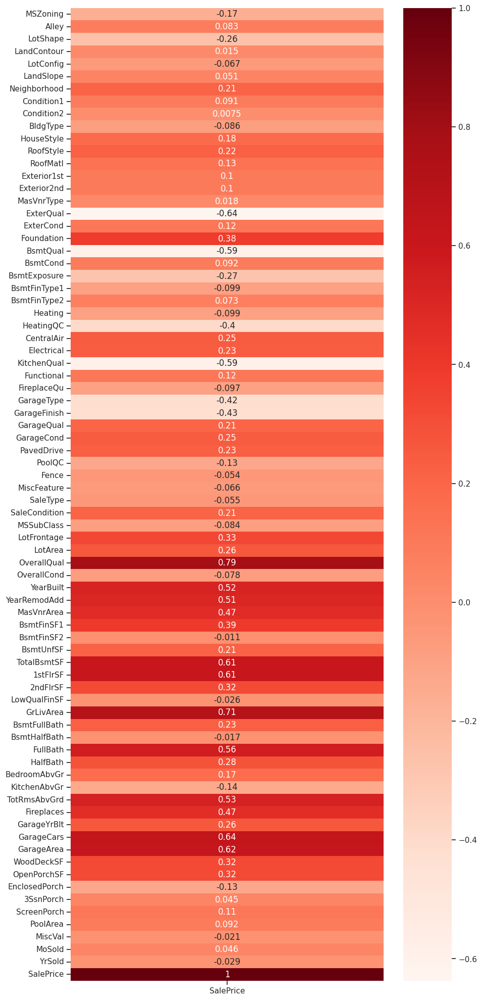

In [179]:
# Correlation feature Selection method
target_corr = combined_processed_data1.corr()[['SalePrice']]
plt.figure(figsize= (10, 25))
sns.heatmap(target_corr, annot = True, cmap = plt.cm.Reds)

In [180]:
target_corr[abs(target_corr)>0.5].dropna()

,SalePrice
ExterQual,-0.636884
BsmtQual,-0.593734
KitchenQual,-0.589189
OverallQual,0.790982
YearBuilt,0.522897
YearRemodAdd,0.507101
TotalBsmtSF,0.613581
1stFlrSF,0.605852
GrLivArea,0.708624
FullBath,0.560664


In [181]:
X3 = X[['ExterQual', 'BsmtQual', 'KitchenQual', 'OverallQual', 'YearBuilt',
       'YearRemodAdd','TotalBsmtSF','1stFlrSF' ,'GrLivArea', 'FullBath', 'TotRmsAbvGrd',
       'GarageCars', 'GarageArea']]

In [182]:
X3.head(4)

,ExterQual,BsmtQual,KitchenQual,OverallQual,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea
0,2,2,2,7,2003,2003,856,856,1710,2,8,2,548
1,3,2,3,6,1976,1976,1262,1262,1262,2,6,2,460
2,2,2,2,7,2001,2002,920,920,1786,2,6,2,608
3,3,4,2,7,1915,1970,756,961,1717,1,7,3,642


In [183]:
data1 = pd.concat([X,y], axis = 1)

## Split Features

In [184]:
X_train,X_test,y_train,y_test = train_test_split(X3,y, test_size = 0.25, random_state = 42)

In [185]:
X_train.shape , X_test.shape

((1095, 13), (365, 13))

# Model Building


## Decision Tree

In [186]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X3,y,random_state=14)

In [187]:
from sklearn.tree import DecisionTreeRegressor #importing decision tree from sklearn.tree

dt=DecisionTreeRegressor() # object creation for decision tree

dt.fit(X_train,y_train) # training the model

DecisionTreeRegressor()

In [188]:
y_pred_dt2 = dt.predict(X_test) # prediction

In [189]:
# Checking Accuracy score
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,mean_absolute_percentage_error
import math

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_dt2):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_dt2):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_dt2):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_dt):.5f}')

Test Mean Squared Error: 1375349256.58082
Test Mean Absolute Error: 25392.56438
Test Mean Absolute Percentage Error: 0.14059
R2 Score: 0.99280


In [190]:
y_train_predict = dt.predict(X_train)
print(f'R2 Score: {r2_score(y_train, y_train_predict):.2f}')

R2 Score: 1.00


### Hyper paramter tuning for Decision tree

In [191]:
from sklearn.model_selection import GridSearchCV

In [192]:
params = {
    "criterion":('friedman_mse', 'poisson', 'squared_error', 'absolute_error'), #quality of split
    "splitter":("best", "random"), # searches the features for a split
    "max_depth":(list(range(1, 20))), #depth of tree range from 1 to 19
    "min_samples_split":[2,20],    #the minimum number of samples required to split internal node
    "min_samples_leaf":list(range(1, 20)),#minimum number of samples required to be at a leaf node,we are passing list which is range from 1 to 19
}

tree_reg = DecisionTreeRegressor(random_state=3)#object creation for decision tree with random state 3
tree_cv = GridSearchCV(tree_reg, params, scoring="neg_mean_squared_error", n_jobs=-1, verbose=1, cv=3)
#passing model to gridsearchCV ,
#tree_clf-->model
#params---->hyperparametes(dictionary we created)
#scoring--->performance matrix to check performance
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.
#verbose=Controls the verbosity: the higher, the more messages.
#>1 : the computation time for each fold and parameter candidate is displayed;
#>2 : the score is also displayed;
#>3 : the fold and candidate parameter indexes are also displayed together with the starting time of the computation.
#cv------> number of flods

tree_cv.fit(X_train,y_train)#training data on gridsearch cv
best_params = tree_cv.best_params_ #it will give you best parameters
print(f"Best paramters: {best_params})")#printing  best parameters

Fitting 3 folds for each of 5776 candidates, totalling 17328 fits
Best paramters: {'criterion': 'friedman_mse', 'max_depth': 12, 'min_samples_leaf': 5, 'min_samples_split': 2, 'splitter': 'random'})


In [193]:
#fitting 3 folds for each of 4332 candidates, totalling 12996 fits
tree_cv.best_params_#getting best parameters from cv

{'criterion': 'friedman_mse',
 'max_depth': 12,
 'min_samples_leaf': 5,
 'min_samples_split': 2,
 'splitter': 'random'}

In [ ]:
tree_cv.best_score_#getting best score form cv

In [194]:
dt_h2=DecisionTreeRegressor(criterion='friedman_mse',max_depth=12,min_samples_leaf= 5,min_samples_split=2,splitter='random')#passing best parameter to decision tree

In [195]:
dt_h2.fit(X_train,y_train)#traing model with best parameter

DecisionTreeRegressor(criterion='friedman_mse', max_depth=12,
                      min_samples_leaf=5, splitter='random')

In [199]:
y_pred_dth2=dt_h2.predict(X_test)#predicting

In [200]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_dth2):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_dth2):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_dth2):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_dth2):.5f}')

Test Mean Squared Error: 1444333952.09119
Test Mean Absolute Error: 24364.20520
Test Mean Absolute Percentage Error: 0.13540
R2 Score: 0.76793


In [202]:
y_train_predict = dt_h2.predict(X_train)
print(f'R2 Score: {r2_score(y_train, y_train_predict):.2f}')

R2 Score: 0.86


## Random Forest- Ensemble Technique

In [203]:
#model creation
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=100)
rf.fit(X_train,y_train)

RandomForestRegressor()

In [207]:
y_pred_rf3=rf.predict(X_test)

In [208]:
print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_rf3):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_rf3):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_rf3):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_rf3):.5f}')

Test Mean Squared Error: 832925505.48394
Test Mean Absolute Error: 19391.02586
Test Mean Absolute Percentage Error: 0.10825
R2 Score: 0.86617


In [209]:
#checking cross validation score
from sklearn.model_selection import cross_val_score

r2_scores = cross_val_score(rf, X_train, y_train, cv=3, scoring='r2')
print(r2_scores)
# Print mean and standard deviation of R-squared scores
print("Random Forest Regressor Cross-Validation R-squared Scores:")
print("Mean R-squared:", np.mean(r2_scores))
print("Standard Deviation of R-squared:", np.std(r2_scores))

[0.86936736 0.70747182 0.87476948]
Random Forest Regressor Cross-Validation R-squared Scores:
Mean R-squared: 0.8172028859361422
Standard Deviation of R-squared: 0.07762291592982774


### Hyper parameter tuning for Randomforest


In [210]:
from sklearn.model_selection import RandomizedSearchCV

In [211]:
# Define the hyperparameter grid
param_dist = {
    'n_estimators': [int(x) for x in np.linspace(start=50, stop=200, num=10)],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider at each split
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required to be at a leaf node
}

In [212]:
from sklearn.model_selection import RandomizedSearchCV

# Create RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf, param_distributions=param_dist, n_iter=10, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, random_state=42
)

In [213]:
# Fit the model
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_depth': [None, 10, 20, 30],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 66, 83, 100, 116,
                                                         133, 150, 166, 183,
                                                         200]},
                   random_state=42, scoring='neg_mean_squared_error')

In [214]:
# Print the best parameters
print("Best Hyperparameters:", random_search.best_params_)

Best Hyperparameters: {'n_estimators': 150, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 10}


In [217]:
rf_reg = RandomForestRegressor(n_estimators= 150, min_samples_split= 5, min_samples_leaf= 1, max_features= 'log2', max_depth= 10)#passing best parameter to randomforest

rf_reg.fit(X_train,y_train)#training

y_rf_reg3=rf_reg.predict(X_test)#testing

In [218]:
# Checking Accuracy score
import math

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_rf_reg3):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_rf_reg3):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_rf_reg3):.5f}')
print(f'R2 Score: {r2_score(y_test, y_rf_reg3):.5f}')

Test Mean Squared Error: 923589846.31999
Test Mean Absolute Error: 19507.53962
Test Mean Absolute Percentage Error: 0.10960
R2 Score: 0.85160


# XGB Regressor


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [221]:
gbm=GradientBoostingRegressor() ## object creation
gbm.fit(X_train,y_train) ## fitting the data
y_gbm3=gbm.predict(X_test) ## predicting the price

In [222]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_gbm3):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_gbm3):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_gbm3):.5f}')
print(f'R2 Score: {r2_score(y_test, y_gbm3):.5f}')

Test Mean Squared Error: 857260996.76805
Test Mean Absolute Error: 19028.55740
Test Mean Absolute Percentage Error: 0.10771
R2 Score: 0.86226


In [223]:
!pip3 install xgboost

In [224]:
import xgboost

In [225]:
from xgboost import XGBRegressor#importing the model library

In [226]:
xgb_r=XGBRegressor() ## object creation
xgb_r.fit(X_train,y_train)# fitting the data

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [227]:
y_pred_xgb=xgb_r.predict(X_test) # predicting the strength of concrete

In [230]:
y_pred_xgb3=xgb_r.predict(X_test) # predicting the strength of concrete

In [231]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_pred_xgb3):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_pred_xgb3):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_pred_xgb3):.5f}')
print(f'R2 Score: {r2_score(y_test, y_pred_xgb3):.5f}')

Test Mean Squared Error: 1138744145.26346
Test Mean Absolute Error: 22234.67361
Test Mean Absolute Percentage Error: 0.12579
R2 Score: 0.81703


## Hyper parameter tuning for XGBoost

In [232]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {'gamma': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4, 200],
              'learning_rate': [0.01, 0.03, 0.06, 0.1, 0.15, 0.2, 0.25, 0.300000012, 0.4, 0.5, 0.6, 0.7],
              'max_depth': [5,6,7,8,9,10,11,12,13,14],
              'n_estimators': [50,65,80,100,115,130,150],
              'reg_alpha': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200],
              'reg_lambda': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200]}

XGB=XGBRegressor(random_state=42,verbosity=0,silent=0)
rcv= RandomizedSearchCV(estimator=XGB, scoring='neg_mean_absolute_error',param_distributions=param_grid, n_iter=100, cv=3,
                               verbose=2, random_state=42, n_jobs=-1)

#estimator--number of decision tree
#scoring--->performance matrix to check performance
#param_distribution-->hyperparametes(dictionary we created)
#n_iter--->Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.default=10
##cv------> number of flods
#verbose=Controls the verbosity: the higher, the more messages.
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.

rcv.fit(X_train, y_train)##training data on randomsearch cv
cv_best_params = rcv.best_params_##it will give you best parameters
print(f"Best paramters: {cv_best_params})")##printing  best parameter

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best paramters: {'reg_lambda': 12.8, 'reg_alpha': 0.1, 'n_estimators': 150, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 0.8})


In [237]:
XGB2=XGBRegressor(reg_lambda= 12.8, reg_alpha= 0.1, n_estimators=150, max_depth=5, learning_rate=0.1, gamma=0.8)
XGB2.fit(X_train, y_train)#training
y_predict_xgb4=XGB2.predict(X_test) # testing

In [238]:
# Checking Accuracy score

print(f'Test Mean Squared Error: {mean_squared_error(y_test,y_predict_xgb4):.5f}')
print(f'Test Mean Absolute Error: {mean_absolute_error(y_test, y_predict_xgb4):.5f}')
print(f'Test Mean Absolute Percentage Error: {mean_absolute_percentage_error(y_test, y_predict_xgb4):.5f}')
print(f'R2 Score: {r2_score(y_test, y_predict_xgb4):.5f}')

Test Mean Squared Error: 1122005974.27676
Test Mean Absolute Error: 20554.83812
Test Mean Absolute Percentage Error: 0.11068
R2 Score: 0.81972


# Adaboostregressor


In [239]:
from sklearn.ensemble import AdaBoostRegressor

In [240]:
ad = AdaBoostRegressor(n_estimators=400)

In [241]:
ad.fit(X_train, y_train)

AdaBoostRegressor(n_estimators=400)

In [242]:
y_ad = ad.predict(X_test)

In [ ]:
r2_score(y_test, y_ad)

### Hyper parameter tuning for it

In [243]:
param_grid = {
    'n_estimators': [50, 100, 200, 300],  # Number of weak learners (trees)
    'learning_rate': [0.01, 0.05, 0.1, 0.5, 1],  # Shrinkage parameter
    'loss': ['linear', 'square', 'exponential']  # Loss function to minimize
}

In [244]:
add = AdaBoostRegressor(n_estimators=100)
ad_reg = GridSearchCV(add, param_grid=param_grid, scoring= 'r2', n_jobs = -1, cv =3, verbose = 2)

In [245]:
ad_reg.fit(X_train, y_train)

Fitting 3 folds for each of 60 candidates, totalling 180 fits


GridSearchCV(cv=3, estimator=AdaBoostRegressor(n_estimators=100), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1, 0.5, 1],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': [50, 100, 200, 300]},
             scoring='r2', verbose=2)

In [246]:
print('Best parameter of AdaBoostRegressor :',ad_reg.best_params_)

Best parameter of AdaBoostRegressor : {'learning_rate': 1, 'loss': 'exponential', 'n_estimators': 50}


In [247]:
print('Best estimator of AdaBoostregressor :',ad_reg.best_estimator_)

Best estimator of AdaBoostregressor : AdaBoostRegressor(learning_rate=1, loss='exponential')


In [248]:
adda = AdaBoostRegressor(learning_rate=1, loss='exponential')
adda.fit(X_train, y_train)

AdaBoostRegressor(learning_rate=1, loss='exponential')

In [249]:
y_hyp_add = adda.predict(X_test)

In [250]:
r2_score(y_test, y_hyp_add)

0.813813937551437

# **Model Performance Summary**

### **All Features**

In [251]:
# Assuming compiled_results is your DataFrame
data = {
    'Model': ['DT', 'DT_H','RF','RF_H','XGB', 'XGBoost','XGBOOST_H'],
    'MAPE': [0.151, 0.139, 0.095, 0.092, 0.085, 0.091,0.087],
    'R-squared': [0.781, 0.749, 0.883, 0.878, 0.889, 0.874, 0.882]
}

compiled_results = pd.DataFrame(data)
compiled_results.set_index('Model', inplace=True)
print(compiled_results)

            MAPE  R-squared
Model                      
DT         0.151      0.781
DT_H       0.139      0.749
RF         0.095      0.883
RF_H       0.092      0.878
XGB        0.085      0.889
XGBoost    0.091      0.874
XGBOOST_H  0.087      0.882


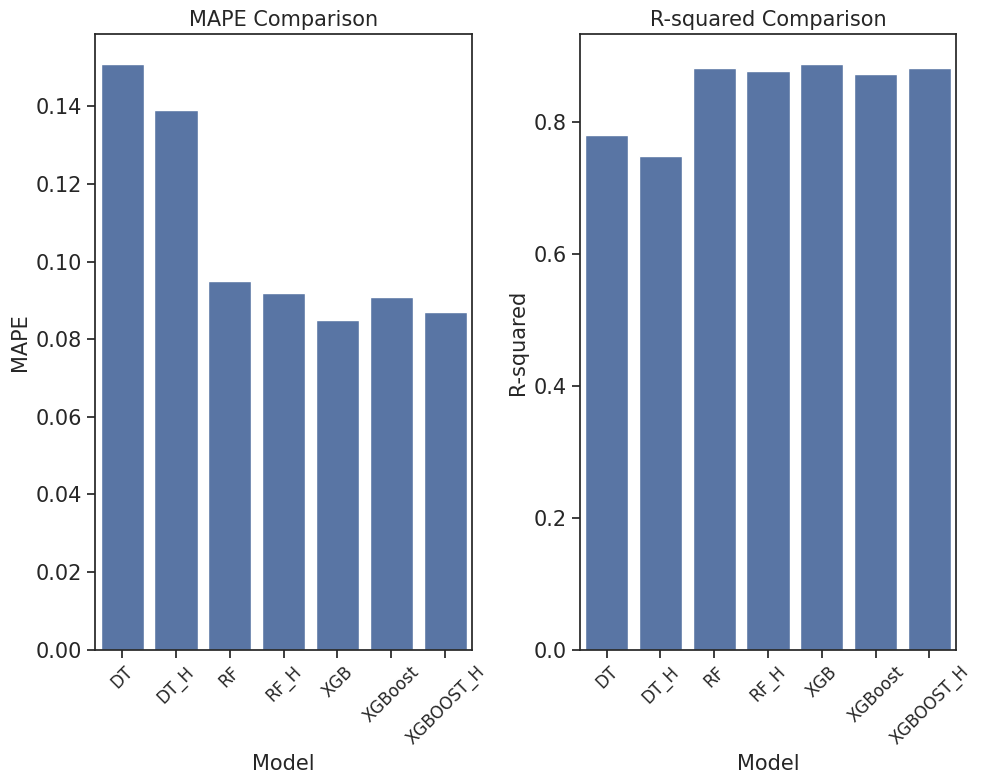

In [252]:
# Extracting metric columns
metrics = compiled_results.columns  # Exclude 'Model'

# Number of subplots
num_plots = len(metrics)

# Create a subplot with a 2x2 grid
fig, axes = plt.subplots(1, 2, figsize=(10, 8))

# Flatten the 2x2 subplot grid for iteration
axes = axes.flatten()

# Loop through each metric and create a bar plot on each axis
for i, metric in enumerate(metrics):
    sns.barplot(x=compiled_results.index, y=compiled_results[metric], ax=axes[i])
    axes[i].set_title(f'{metric} Comparison',fontsize=15)
    axes[i].set_ylabel(metric,fontsize=15)
    axes[i].set_xlabel('Model',fontsize=15)
    axes[i].tick_params(axis='x', rotation=45, labelsize=12)
    axes[i].tick_params(axis='y',labelsize=15)

# Adjust layout
plt.tight_layout()
plt.show()

### **All Features and Engineered Features**

In [253]:
# Assuming compiled_results is your DataFrame
data = {
    'Model': ['DT', 'DT_H','RF','RF_H','XGB', 'XGBoost','XGBOOST_H'],
    'MAPE': [0.00361, 0.00351, 0.00232, 0.00357, 0.00408,0.00630,0.00414],
    'R-squared': [0.99280,0.99520,0.99728, 0.99475,0.99873 ,0.98811,0.99149]
}

compiled_results = pd.DataFrame(data)
compiled_results.set_index('Model', inplace=True)
print(compiled_results)

              MAPE  R-squared
Model                        
DT         0.00361    0.99280
DT_H       0.00351    0.99520
RF         0.00232    0.99728
RF_H       0.00357    0.99475
XGB        0.00408    0.99873
XGBoost    0.00630    0.98811
XGBOOST_H  0.00414    0.99149


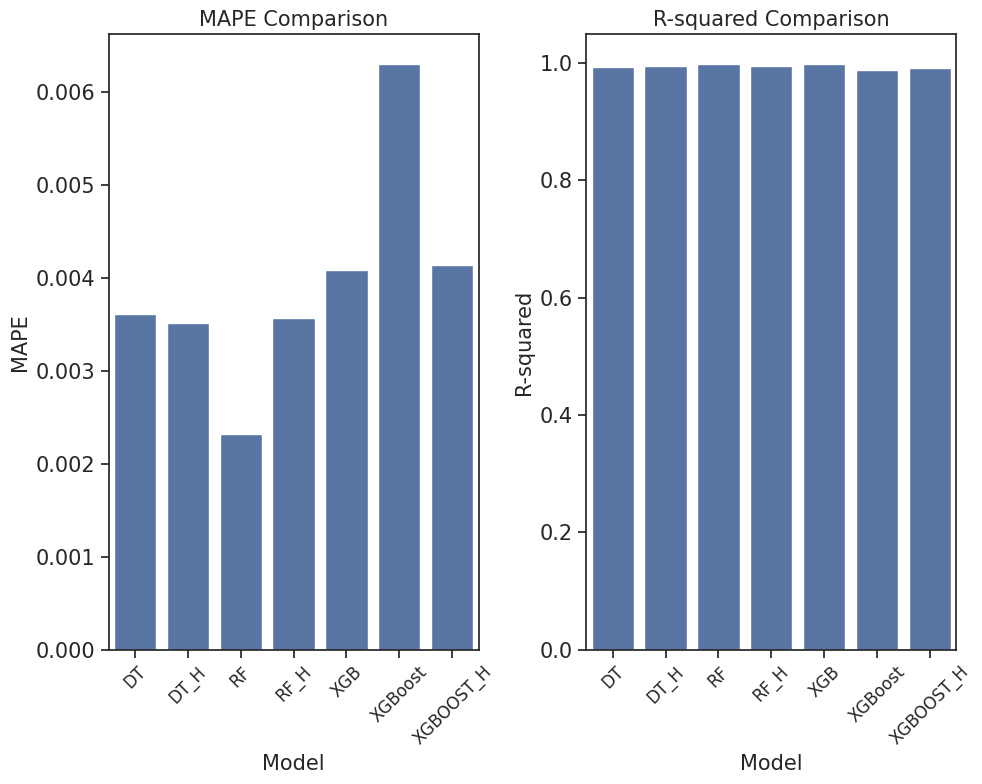

In [254]:
# Extracting metric columns
metrics = compiled_results.columns  # Exclude 'Model'

# Number of subplots
num_plots = len(metrics)

# Create a subplot with a 2x2 grid
fig, axes = plt.subplots(1, 2, figsize=(10, 8))

# Flatten the 2x2 subplot grid for iteration
axes = axes.flatten()

# Loop through each metric and create a bar plot on each axis
for i, metric in enumerate(metrics):
    sns.barplot(x=compiled_results.index, y=compiled_results[metric], ax=axes[i])
    axes[i].set_title(f'{metric} Comparison',fontsize=15)
    axes[i].set_ylabel(metric,fontsize=15)
    axes[i].set_xlabel('Model',fontsize=15)
    axes[i].tick_params(axis='x', rotation=45, labelsize=12)
    axes[i].tick_params(axis='y',labelsize=15)

# Adjust layout
plt.tight_layout()
plt.show()

### Model Performance Summary (Selected Features)

In [257]:
# Assuming compiled_results is your DataFrame
data = {
    'Model': ['DT','RF','XGB', 'XGBoost','AdaB'],
    'MAPE': [0.13540,0.10960,0.12579,0.11068,0.14392],
    'R-squared': [0.76793,0.85160,0.81703,0.81972,0.81381]
}

compiled_results = pd.DataFrame(data)
compiled_results.set_index('Model', inplace=True)
print(compiled_results)

            MAPE  R-squared
Model                      
DT       0.13540    0.76793
RF       0.10960    0.85160
XGB      0.12579    0.81703
XGBoost  0.11068    0.81972
AdaB     0.14392    0.81381


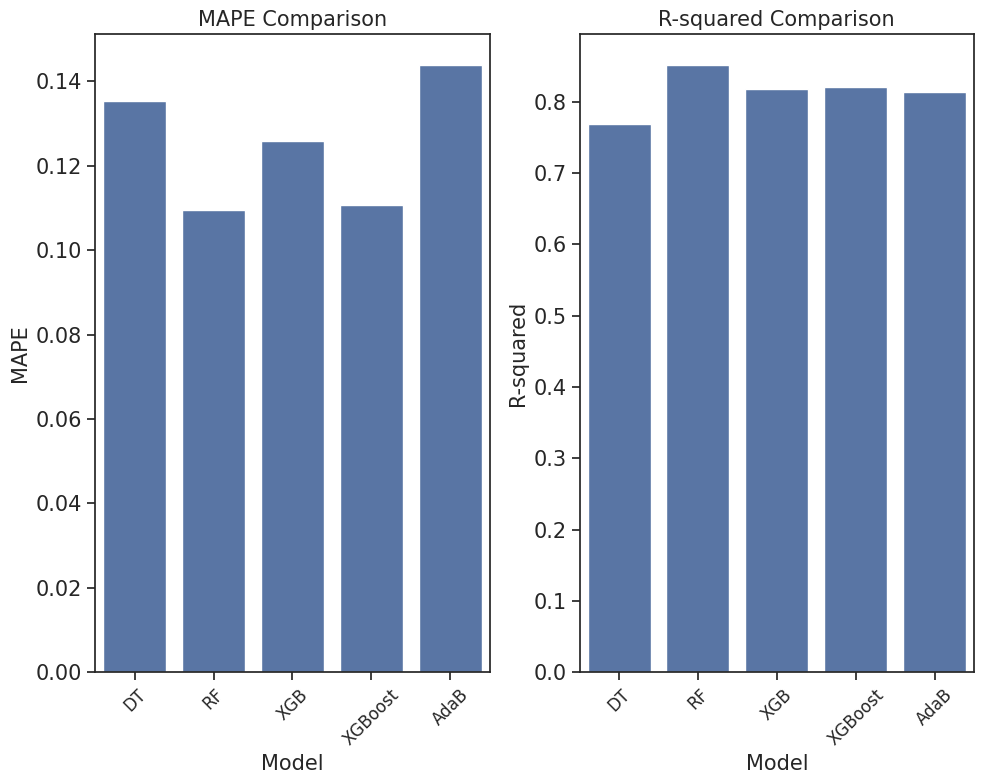

In [258]:
# Extracting metric columns
metrics = compiled_results.columns  # Exclude 'Model'

# Number of subplots
num_plots = len(metrics)

# Create a subplot with a 2x2 grid
fig, axes = plt.subplots(1, 2, figsize=(10, 8))

# Flatten the 2x2 subplot grid for iteration
axes = axes.flatten()

# Loop through each metric and create a bar plot on each axis
for i, metric in enumerate(metrics):
    sns.barplot(x=compiled_results.index, y=compiled_results[metric], ax=axes[i])
    axes[i].set_title(f'{metric} Comparison',fontsize=15)
    axes[i].set_ylabel(metric,fontsize=15)
    axes[i].set_xlabel('Model',fontsize=15)
    axes[i].tick_params(axis='x', rotation=45, labelsize=12)
    axes[i].tick_params(axis='y',labelsize=15)

# Adjust layout
plt.tight_layout()
plt.show()

## Model Comparison Summary

**Models used:**
- Decision Forest(DF)
- RF(Random Forest)
- XGB(XGBoost)
- AdaBoost

**Evaluation Metrics:**
- Mean Absolute Percentage Error (MAPE): Measures the percentage difference between actual and predicted values.
- R-squared (R²): Measures the proportion of the variance in the dependent variable that is predictable from the independent variables.

**Model Comaparison:**

**1. For all the features:

- The Decision Tree model shows a higher training R2 score compared to the testing R2 score, suggesting potential overfitting. It captures complexities in the training data but may struggle with generalization to new data.
- Despite hyperparameter tuning, the Decision Tree with hyperparameters still exhibits a higher training R2 score than the testing R2 score. Further optimization may be considered to enhance generalization.
- Random Forest demonstrates a lower training R2 score but significantly higher testing R2 score, indicating effective generalization and robust performance.
- Similar to RF, the Random Forest with hyperparameters maintains a balance between training and testing R2 scores, showcasing robust generalization capabilities.
- XGBoost demonstrates a competitive performance with a slightly lower training R2 score but a high testing R2 score, suggesting a well-balanced model.
- The XGBoost model, even with hyperparameters, maintains a balanced performance, indicating effective generalization to new data.
- Similar to XGBoost, the hyperparameter-tuned version shows competitive performance, with a well-balanced training and testing R2 score.

**2. All features and Engineered Features :**

- **Significant and remarkable improvement in prediction accuracy is observed for all algorithms in the region of 98-99% R2 Score. This underscores the impact of engineered features in improving the robustness and generalizatiton of advanced regression algorithms. 

**3. Selected Features:

- Random Forest (RF) exhibits the highest testing R2 score (0.85160), indicating strong generalization performance.
- Decision Tree (DT) has a lower testing R2 score, suggesting some degree of overfitting.
- XGBoost and its alternative entry show competitive testing R2 scores (0.81703 and 0.81972), positioning them as effective models.
- AdaBoost (AdaB) has a decent testing R2 score (0.81381), but it falls behind Random Forest.
- The Decision Tree model displays an unusual pattern with an extremely low training R2 score and a remarkably high testing R2 score. This discrepancy suggests potential issues such as underfitting or limited model complexity.

**Recommendations:**
- XGBoost emerges as the primary choice for its robust performance across various scenarios. With a well-balanced combination of competitive testing R2 scores (ranging from 0.85 to 0.889), XGBoost showcases effective model fitting and generalization. The model's ability to maintain a balanced performance even after hyperparameter tuning further underscores its suitability for diverse datasets.

- Recommendations for optimizing the XGBoost model further include exploring additional hyperparameter tuning to fine-tune its performance. This may involve adjusting parameters such as learning rate, maximum depth, and subsample ratio to achieve the best possible results for a specific dataset. Additionally, feature importance analysis can provide insights into which features contribute the most to the model's predictive power, aiding in feature selection or engineering.

- **In summary, for computational efficiency, it is recommended to apply selected features to the prediction algorithms at the price of limited 80 - 86% accuracy. Where higher accuracies are required, relevant engineered features combined with processed raw data would significantly increase accuracy to 98 - 99%.

## **Our suggestions to prospective home buyers**

1. Quality and Renovation:

- Prioritize houses with higher 'OverallQual' ratings, indicating superior quality. Focus on properties with recent renovations ('YearRemodAdd') for modern and updated living spaces.

2. Optimal Living Space:

- Seek homes with ample living space, using features like 'GrLivArea' and 'TotalSF'. A spacious home enhances comfort and caters to diverse lifestyle needs.

3. Basement Evaluation:

- Pay attention to 'BsmtFinSF1' and 'TotalBsmtSF' to assess basement quality and size. A well-finished and spacious basement offers versatility for various purposes.

4. Functional Layout:

- Evaluate the functionality of the house layout with '1stFlrSF'. An efficiently designed first floor contributes to a comfortable living experience.

5. Bathroom and Garage Features:

- Consider the number of bathrooms ('FullBath') for convenience. Assess garage features like 'GarageCars' and 'GarageArea' to meet parking and storage needs.

6. Total Area Consideration:

- Examine 'totalSF' and 'Total_bmt_area' to gauge the overall house size, encompassing both living and basement areas. This provides a comprehensive understanding of property size.

7. Outdoor Space and Lot Size:

- Evaluate outdoor living space with 'LotArea'. Larger lots may offer more privacy and room for outdoor activities. Financial Planning:

- Ensure selected houses align with budget constraints, considering the correlation between these features and house prices.